In [161]:
# Greg Maurer - August 2015

library(ggplot2)
library(plyr)
library(reshape2)

theme_set(theme_bw())

setwd('~/current/NMEG_seasonality/')

proc_path <- 'processed_data/'

source('~/current/NMEG_utils/r_functions/printfigs.r')
source('~/current/NMEG_utils/r_functions/load_nmeg.r')
source('~/current/NMEG_utils/r_functions/transform_nmeg.r')
#source('load_datasets.r')

# Get flux datasets
seg <- get_daily_file('Seg', 'aflx', make_new=FALSE)
ses <- get_daily_file('Ses', 'aflx')
wjs <- get_daily_file('Wjs', 'aflx')
mpj <- get_daily_file('Mpj', 'aflx')
vcp <- get_daily_file('Vcp', 'aflx')
vcm <- get_daily_file('Vcm', 'aflx')
seg_s <- get_daily_file('Seg', 'soilmet', make_new=FALSE)
ses_s <- get_daily_file('Ses', 'soilmet')
wjs_s <- get_daily_file('Wjs', 'soilmet')
mpj_s <- get_daily_file('Mpj', 'soilmet')
vcp_s <- get_daily_file('Vcp', 'soilmet')
vcm_s <- get_daily_file('Vcm', 'soilmet')

In [162]:
# Drop everything from water year 2015
sitelist <- list(seg, ses, wjs, mpj)
sitenames <- c('Seg', 'Ses', 'Wjs', 'Mpj')
FC_daily <- get_var_allsites(sitelist, 'FC_F_g_int', sitenames, startyear=2007, endyear=2014)
GPP_daily <- get_var_allsites(sitelist, 'GPP_g_int', sitenames, startyear=2007, endyear=2014)
RE_daily <- get_var_allsites(sitelist, 'RECO_g_int', sitenames, startyear=2007, endyear=2014)
ET_daily <- get_var_allsites(sitelist, 'ET_F_mm_daytime', sitenames, startyear=2007, endyear=2014)
P_gauge_daily <- get_var_allsites(sitelist, 'P_F', sitenames, startyear=2007, endyear=2014)
sitelist_s <- list(seg_s, ses_s, wjs_s, mpj_s)
deep_swc <- get_var_allsites(sitelist_s, 'deep_swc_interp', sitenames, startyear=2007, endyear=2014)
mid_swc <- get_var_allsites(sitelist_s, 'mid_swc_interp', sitenames, startyear=2007, endyear=2014)
shall_swc <- get_var_allsites(sitelist_s, 'shall_swc_interp', sitenames, startyear=2007, endyear=2014)

tail(deep_swc)

,date,Seg,Ses,Wjs,Mpj
2917,2014-12-26,0.0795779,0.08733025,0.1247283,0.09597953
2918,2014-12-27,0.07916671,0.08636071,0.1237736,0.1025713
2919,2014-12-28,0.07838371,0.08522189,0.1225449,0.09553806
2920,2014-12-29,0.07789593,0.08493081,0.1221726,0.1136492
2921,2014-12-30,0.07776285,0.08505143,0.1223486,0.1148706
2922,2014-12-31,0.07752307,0.08430307,0.1211362,0.1185992


In [163]:
# Function to clean up unused columns and rename variables
clean_rename <- function(df, keep=c("season", "year_w", sitenames)){
    df_c_r <- add_WY_cols(df)
    df_c_r <- subset(df_c_r, subset = (year_w > 2007 & year_w < 2015))
    #print(head(df_c_r))
    #print(tail(df_c_r))
    df_c_r <- df_c_r[, keep]
    #df_c_r <- rename_vars(df_c_r)
    df_c_r$season <- revalue(df_c_r$season, c("cold"="Cold",
                            "monsoon"="Monsoon",
                            "spring"="Spring"))
    reorder <- c('Cold', 'Spring', 'Monsoon')
    df_c_r$season <- factor(df_c_r$season, levels=reorder)
    return(df_c_r)
}

## Cumulative NEE by year

* Showing as bars and lines

ymax not defined: adjusting position using y instead
ymax not defined: adjusting position using y instead
ymax not defined: adjusting position using y instead
ymax not defined: adjusting position using y instead


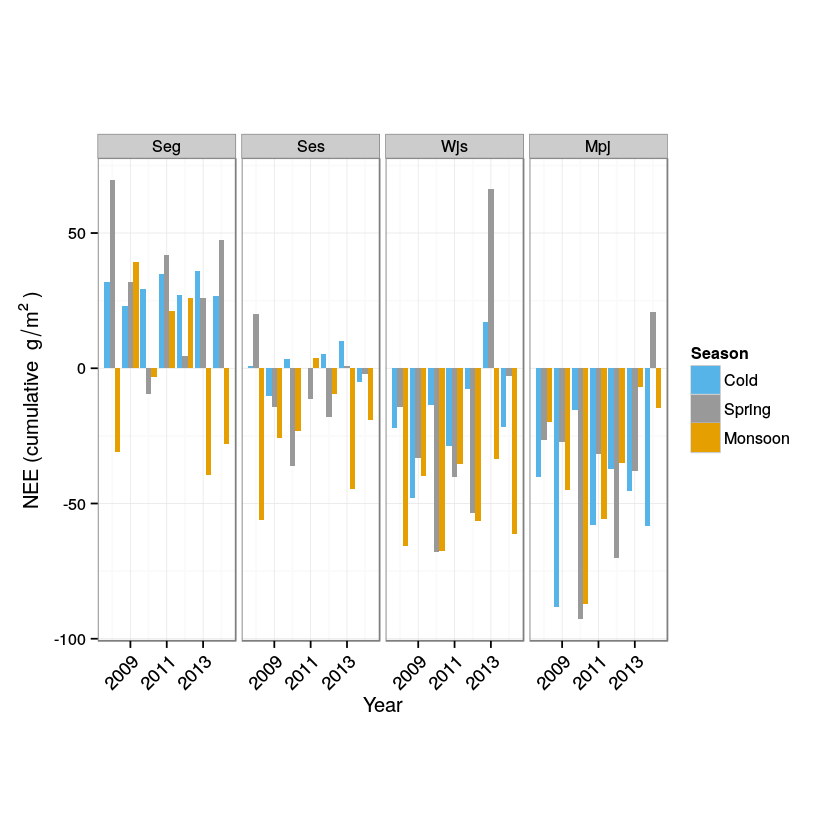

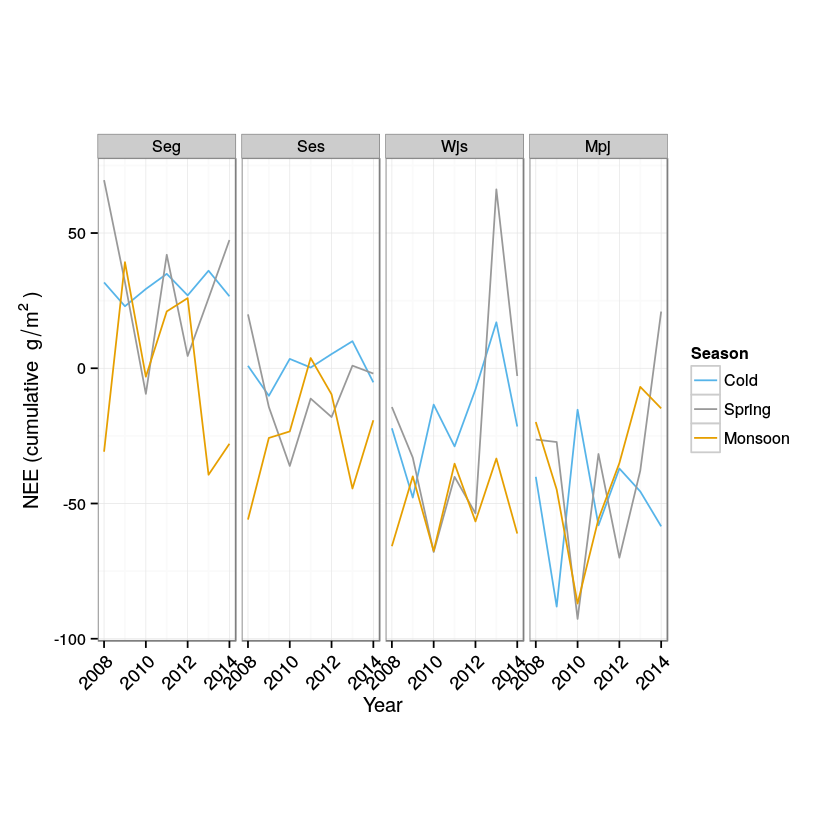

In [164]:
# Look at cumulative NEE divided into the 3 seasons
FC.m <- melt(clean_rename(FC_daily), id.vars=c('season', 'year_w'))
FC.m <- ddply(FC.m, .(variable, season, year_w), summarise, seas_sum = sum(value, na.rm = T))

NEE_seas_by_yr <- ggplot(FC.m, aes(x=year_w, y=seas_sum, fill=factor(season))) +
    geom_bar(stat='identity', position='dodge') + facet_wrap(~variable, nrow=1) + 
    xlab('Year') + ylab(bquote('NEE (cumulative '~ g/m^2 ~')')) +
    theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
    scale_fill_manual(values=c("#56B4E9", "#999999", "#E69F00"), name="Season") +
    theme(aspect.ratio=3.5)
NEE_seas_by_yr

NEE_seas_by_yr2 <- ggplot(FC.m, aes(x=year_w, y=seas_sum,, color=factor(season))) +
    geom_line(stat='identity', position='dodge') + facet_wrap(~variable, nrow=1) + 
    xlab('Year') + ylab(bquote('NEE (cumulative '~ g/m^2 ~')')) +
    theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
    scale_color_manual(values=c("#56B4E9", "#999999", "#E69F00"), name="Season") +
    theme(aspect.ratio=3.5)
NEE_seas_by_yr2

In [165]:
outpath = 'figures/'
printfigs(NEE_seas_by_yr, 'NEE_seas_by_yr.pdf', outpath, 9, 4)
printfigs(NEE_seas_by_yr2, 'NEE_seas_by_yr2.pdf', outpath, 9, 4)

pdf 
  2

ymax not defined: adjusting position using y instead
ymax not defined: adjusting position using y instead
ymax not defined: adjusting position using y instead
ymax not defined: adjusting position using y instead


pdf 
  2

## Cumulative GPP by year

* Showing as bars and lines

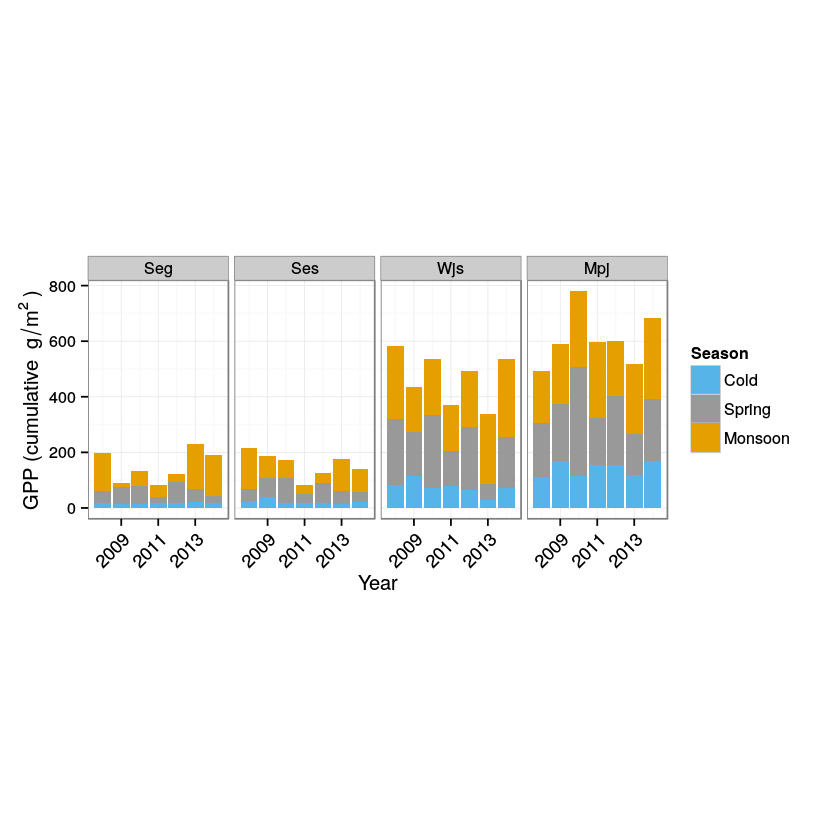

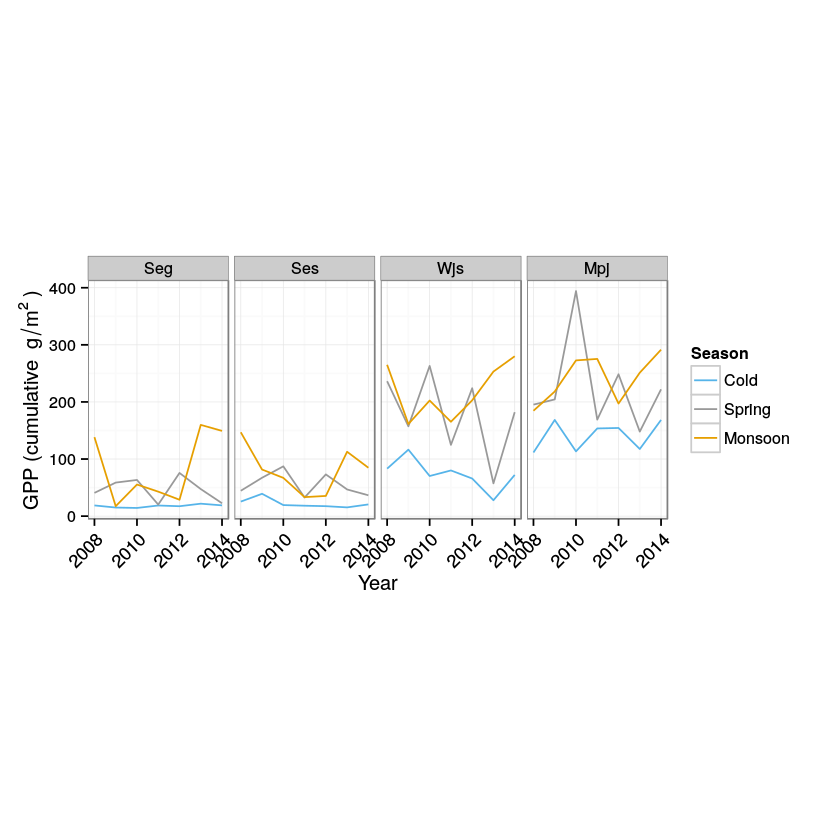

In [166]:
# Same for GPP
GPP.m <- melt(clean_rename(GPP_daily), id.vars=c('season', 'year_w'))
GPP.m <- ddply(GPP.m, .(variable, season, year_w), summarise, seas_sum = sum(value, na.rm = T))

GPP_seas_by_yr <- ggplot(GPP.m, aes(x=year_w, y=seas_sum, fill=factor(season))) +
    geom_bar(stat='identity') + facet_wrap(~variable, nrow=1) + 
    xlab('Year') + ylab(bquote('GPP (cumulative '~ g/m^2 ~')')) +
    theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
    scale_fill_manual(values=c("#56B4E9", "#999999", "#E69F00"), name="Season") +
    theme(aspect.ratio=1.7)
GPP_seas_by_yr

GPP_seas_by_yr2 <- ggplot(GPP.m, aes(x=year_w, y=seas_sum, color=factor(season))) +
    geom_line(stat='identity') + facet_wrap(~variable, nrow=1) + 
    xlab('Year') + ylab(bquote('GPP (cumulative '~ g/m^2 ~')')) +
    theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
    scale_color_manual(values=c("#56B4E9", "#999999", "#E69F00"), name="Season") +
    theme(aspect.ratio=1.7)
GPP_seas_by_yr2

In [167]:
printfigs(GPP_seas_by_yr, 'GPP_seas_by_yr.pdf', outpath, 9, 4)
printfigs(GPP_seas_by_yr2, 'GPP_seas_by_yr2.pdf', outpath, 9, 4)

pdf 
  2

pdf 
  2

## Cumulative GPP as percent of total by year

,variable,year_w,season,pct
1,Seg,2008,Cold,0.09482844
2,Seg,2008,Spring,0.2060671
3,Seg,2008,Monsoon,0.6991044
4,Seg,2009,Cold,0.1650904
5,Seg,2009,Spring,0.6439455
6,Seg,2009,Monsoon,0.1909641


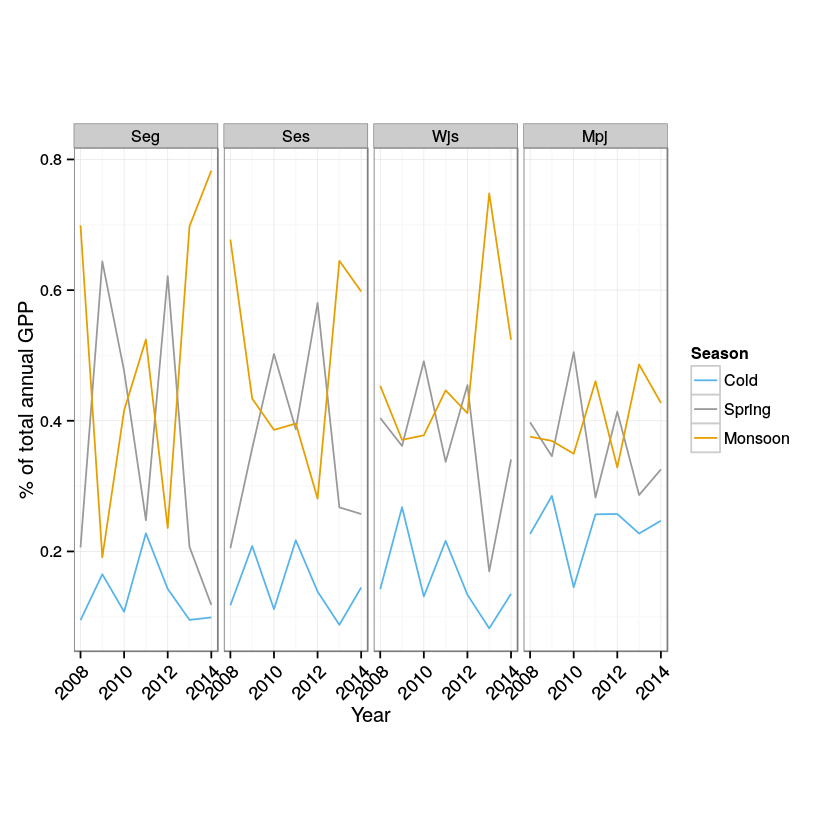

In [168]:
# Calculate seasonal GPP as a percentage for the year
GPP.pct <- ddply(GPP.m, .(variable, year_w), summarise, season=season, pct = seas_sum/sum(seas_sum, na.rm = T))
head(GPP.pct)

GPP_seas_pct_yr <- ggplot(GPP.pct, aes(x=year_w, y=pct, color=factor(season))) +
    geom_line(stat='identity') + facet_wrap(~variable, nrow=1) + 
    xlab('Year') + ylab('% of total annual GPP' ) +
    theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
    scale_color_manual(values=c("#56B4E9", "#999999", "#E69F00"), name="Season") +
    theme(aspect.ratio=3.5)

GPP_seas_pct_yr

In [169]:
printfigs(GPP_seas_pct_yr, 'GPP_seaspct_yr.pdf', outpath, 9, 4)

pdf 
  2

## Cumulative Reco by year

* Showing as bars and lines

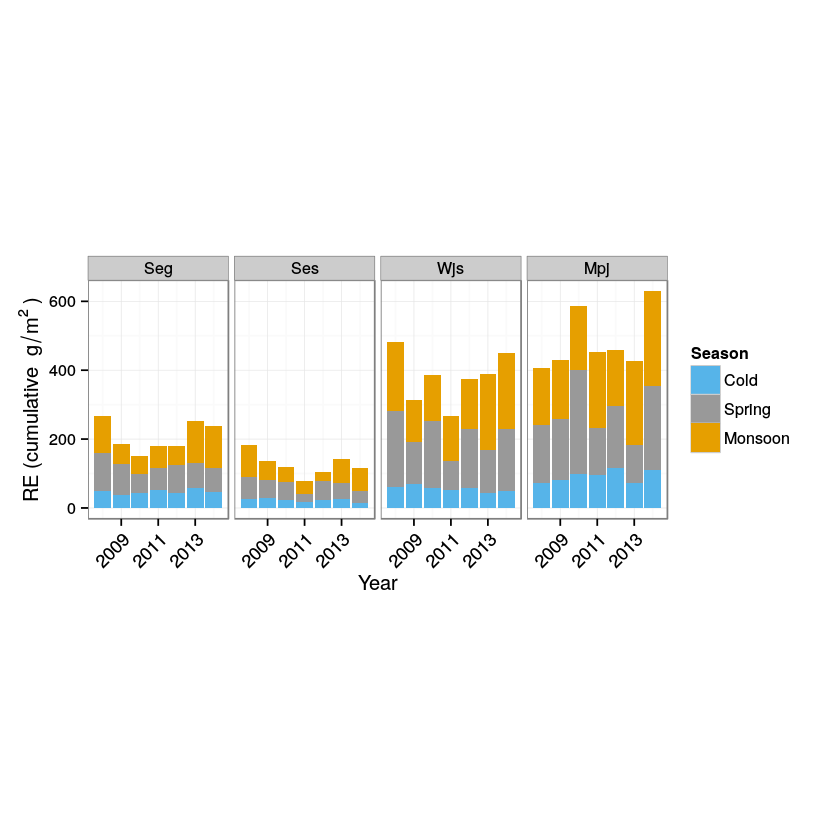

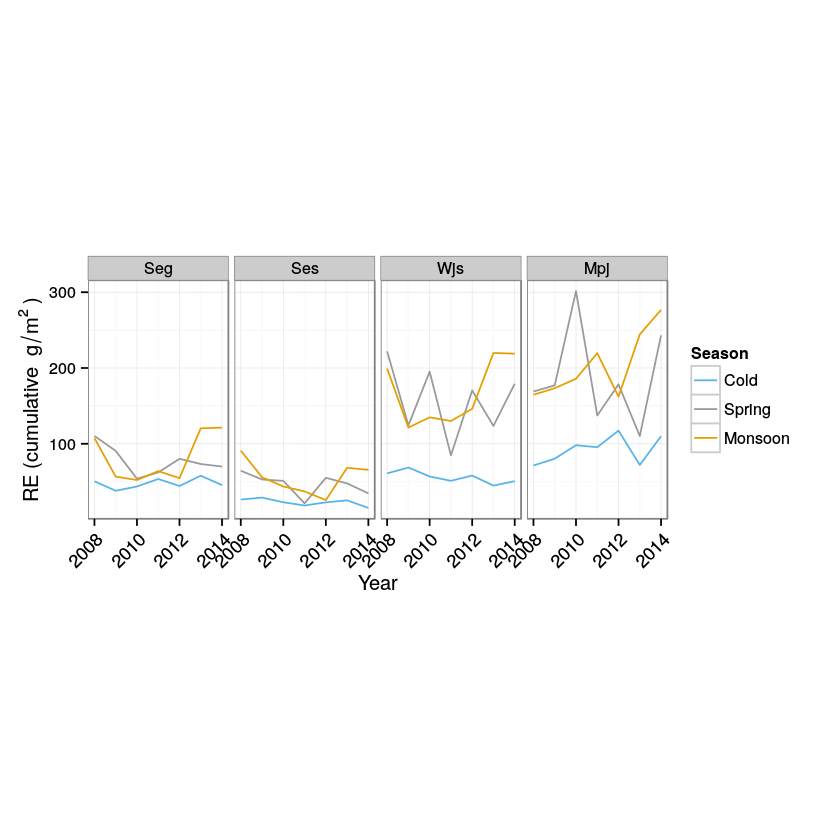

In [170]:
RE.m <- melt(clean_rename(RE_daily), id.vars=c('season', 'year_w'))
RE.m <- ddply(RE.m, .(variable, season, year_w), summarise, seas_sum = sum(value, na.rm = T))

RE_seas_by_yr <- ggplot(RE.m, aes(x=year_w, y=seas_sum, fill=factor(season))) +
  geom_bar(stat='identity') + facet_wrap(~variable, nrow=1) + 
  xlab('Year') + ylab(bquote('RE (cumulative '~ g/m^2 ~')')) +
  theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
  scale_fill_manual(values=c("#56B4E9", "#999999", "#E69F00"), name="Season") +
    theme(aspect.ratio=1.7)
RE_seas_by_yr

RE_seas_by_yr2 <- ggplot(RE.m, aes(x=year_w, y=seas_sum, color=factor(season))) +
  geom_line(stat='identity') + facet_wrap(~variable, nrow=1) + 
  xlab('Year') + ylab(bquote('RE (cumulative '~ g/m^2 ~')')) +
  theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
  scale_color_manual(values=c("#56B4E9", "#999999", "#E69F00"), name="Season") +
    theme(aspect.ratio=1.7)
RE_seas_by_yr2

In [171]:
printfigs(RE_seas_by_yr, 'RE_seas_by_yr.pdf', outpath, 9, 4)
printfigs(RE_seas_by_yr2, 'RE_seas_by_yr2.pdf', outpath, 9, 4)

pdf 
  2

pdf 
  2

## Cumulative Reco as percent of total by year

,variable,year_w,season,pct
1,Seg,2008,Cold,0.1882145
2,Seg,2008,Spring,0.4112419
3,Seg,2008,Monsoon,0.4005437
4,Seg,2009,Cold,0.2051457
5,Seg,2009,Spring,0.4889964
6,Seg,2009,Monsoon,0.3058578


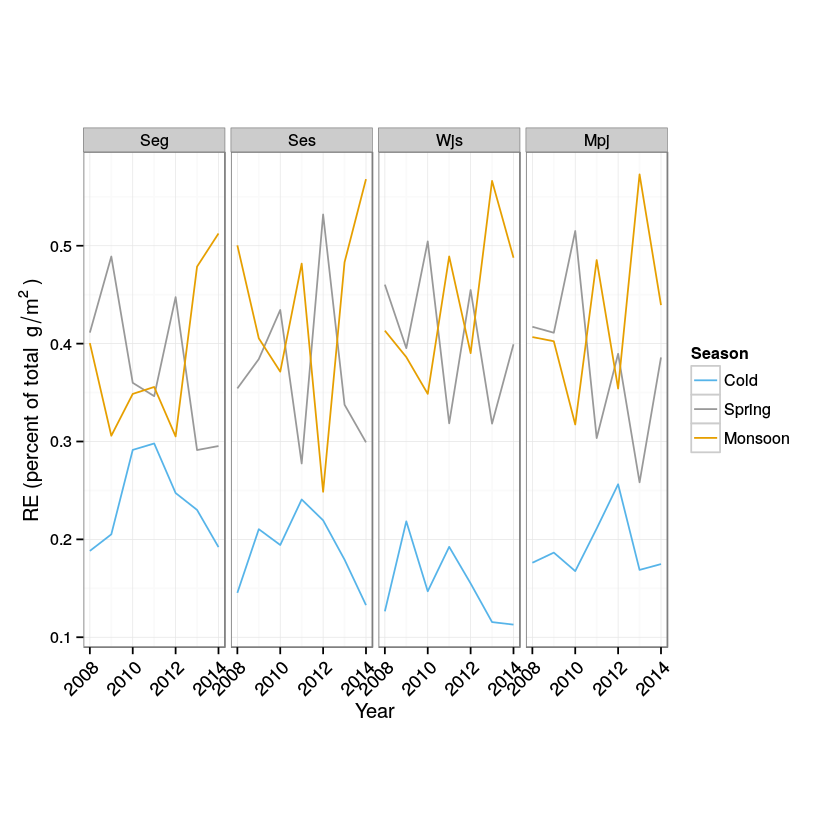

In [172]:
# Calculate seasonal RE as a percentage for the year
RE.pct <- ddply(RE.m, .(variable, year_w), summarise, season=season, pct = seas_sum/sum(seas_sum, na.rm = T))
head(RE.pct)

RE_seas_pct_yr <- ggplot(RE.pct, aes(x=year_w, y=pct, color=factor(season))) +
    geom_line(stat='identity') + facet_wrap(~variable, nrow=1) + 
    xlab('Year') + ylab(bquote('RE (percent of total '~ g/m^2 ~')')) +
    theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
    scale_color_manual(values=c("#56B4E9", "#999999", "#E69F00"), name="Season") +
    theme(aspect.ratio=3.5)

RE_seas_pct_yr

In [173]:
printfigs(RE_seas_pct_yr, 'RE_seaspct_yr.pdf', outpath, 9, 4)

pdf 
  2

## Cumulative ET by year (total and percent)

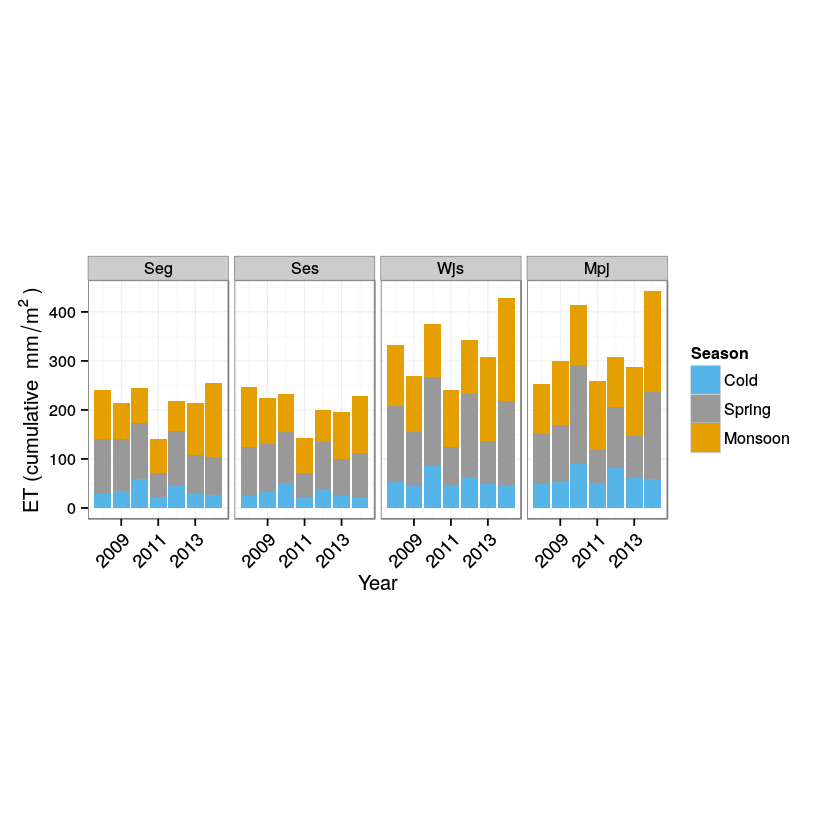

,variable,year_w,season,pct
1,Seg,2008,Cold,0.129568
2,Seg,2008,Spring,0.4562026
3,Seg,2008,Monsoon,0.4142294
4,Seg,2009,Cold,0.1593935
5,Seg,2009,Spring,0.4973419
6,Seg,2009,Monsoon,0.3432646


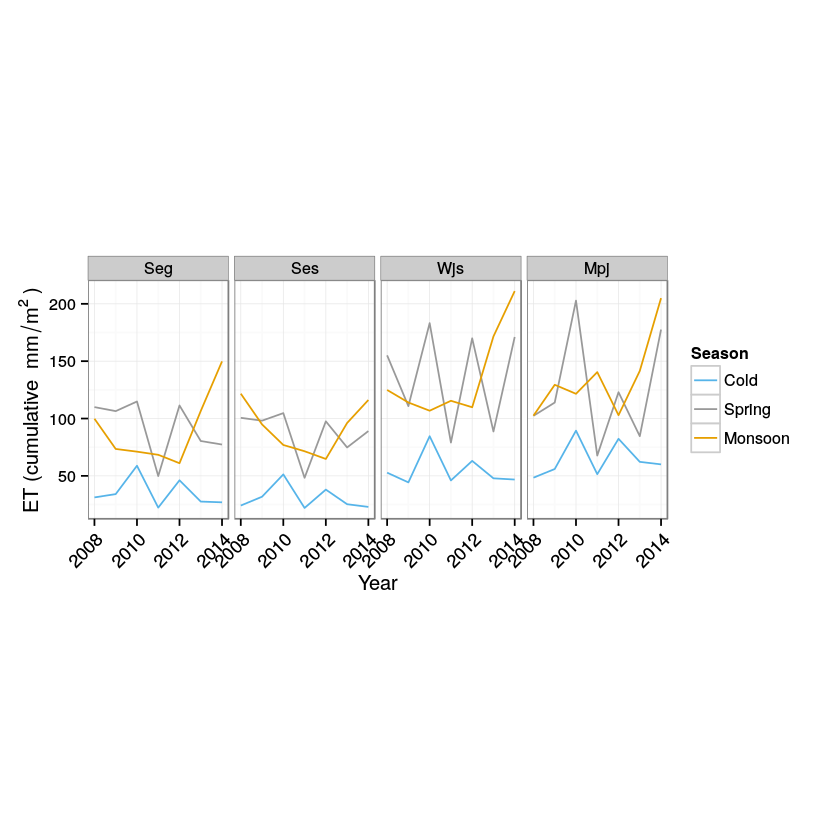

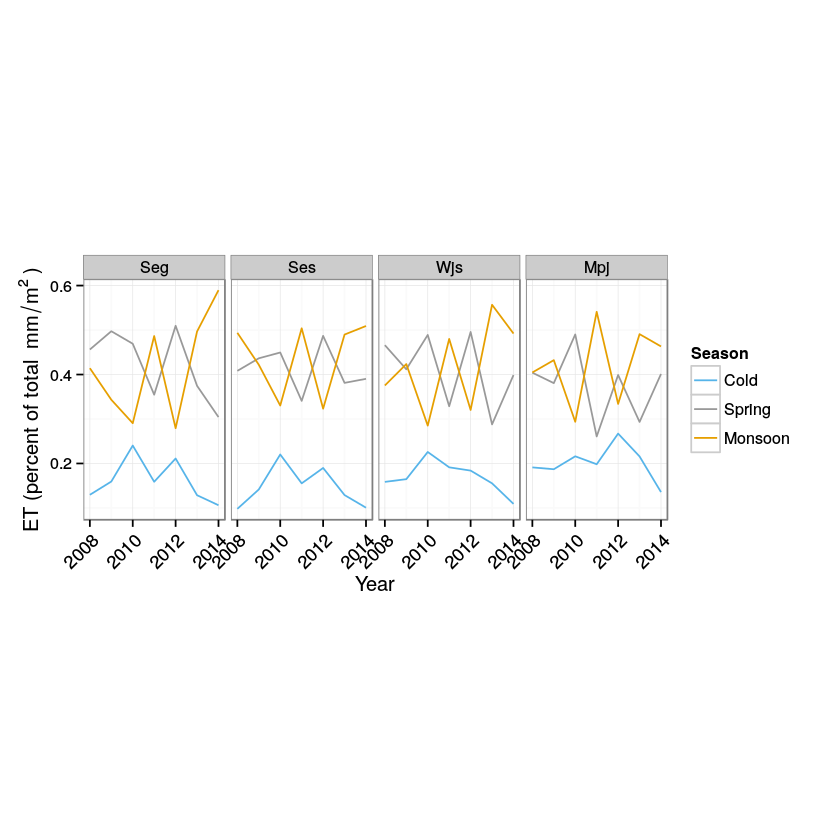

In [174]:
ET.m <- melt(clean_rename(ET_daily), id.vars=c('season', 'year_w'))
ET.m <- ddply(ET.m, .(variable, season, year_w), summarise, seas_sum = sum(value, na.rm = T))

ET_seas_by_yr <- ggplot(ET.m, aes(x=year_w, y=seas_sum, fill=factor(season))) +
  geom_bar(stat='identity') + facet_wrap(~variable, nrow=1) + 
  xlab('Year') + ylab(bquote('ET (cumulative '~ mm/m^2 ~')')) +
  theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
  scale_fill_manual(values=c("#56B4E9", "#999999", "#E69F00"), name="Season") +
    theme(aspect.ratio=1.7)
ET_seas_by_yr

ET_seas_by_yr2 <- ggplot(ET.m, aes(x=year_w, y=seas_sum, color=factor(season))) +
  geom_line(stat='identity') + facet_wrap(~variable, nrow=1) + 
  xlab('Year') + ylab(bquote('ET (cumulative '~ mm/m^2 ~')')) +
  theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
  scale_color_manual(values=c("#56B4E9", "#999999", "#E69F00"), name="Season") +
    theme(aspect.ratio=1.7)
ET_seas_by_yr2

# Calculate seasonal ET as a percentage for the year
ET.pct <- ddply(ET.m, .(variable, year_w), summarise, season=season, pct = seas_sum/sum(seas_sum, na.rm = T))
head(ET.pct)

ET_seas_pct_yr <- ggplot(ET.pct, aes(x=year_w, y=pct, color=factor(season))) +
    geom_line(stat='identity') + facet_wrap(~variable, nrow=1) + 
    xlab('Year') + ylab(bquote('ET (percent of total '~ mm/m^2 ~')')) +
    theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
    scale_color_manual(values=c("#56B4E9", "#999999", "#E69F00"), name="Season") +
    theme(aspect.ratio=1.7)
ET_seas_pct_yr

In [175]:
printfigs(ET_seas_by_yr, 'ET_seas_by_yr.pdf', outpath, 9, 4)
printfigs(ET_seas_by_yr2, 'ET_seas_by_yr2.pdf', outpath, 9, 4)
printfigs(ET_seas_pct_yr, 'ET_seas_pct_yr.pdf', outpath, 9, 4)

pdf 
  2

pdf 
  2

pdf 
  2

## Multiyear GPP and Reco

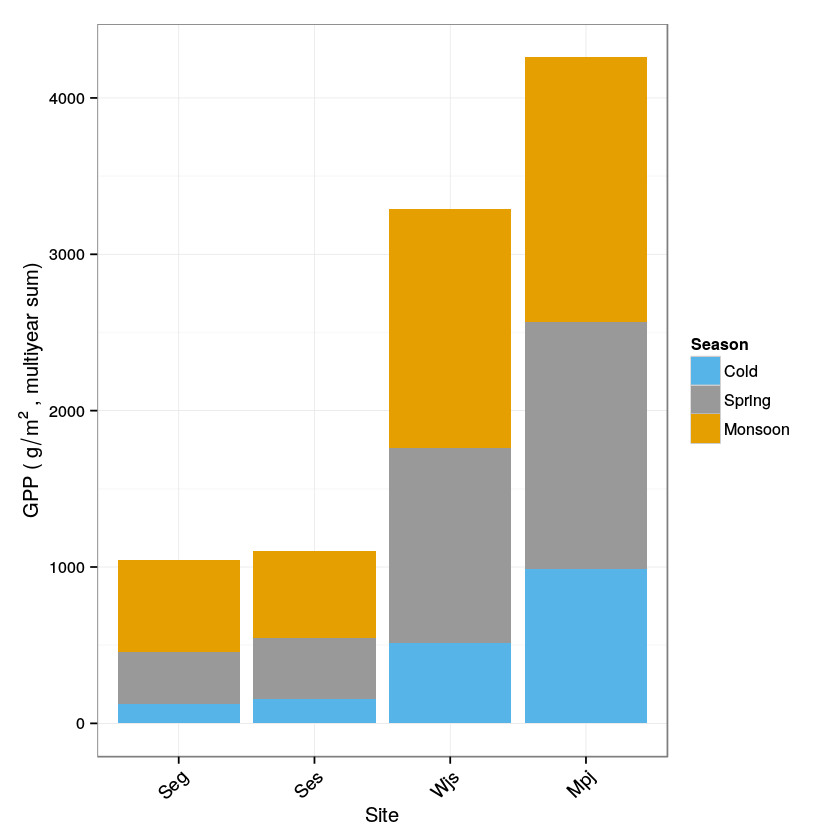

In [176]:
# Look at 5 year cumulative GPP, divided into the 3 seasons
GPP.m <- melt(clean_rename(GPP_daily), id.vars='season')
GPP.m <- subset(GPP.m, subset=(variable != 'year_w'))
GPP.m <- ddply(GPP.m, .(variable, season), summarise, sum = sum(value, na.rm = T))

GPP_seas_multiyr <- ggplot(GPP.m, aes(x=variable, y=sum, fill=factor(season))) +
  geom_bar(stat='identity') + xlab('Site') + 
  ylab(bquote('GPP ('~ g/m^2 ~', multiyear sum)')) +
  theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
  scale_fill_manual(values=c("#56B4E9", "#999999", "#E69F00"), 
                    name="Season")
GPP_seas_multiyr

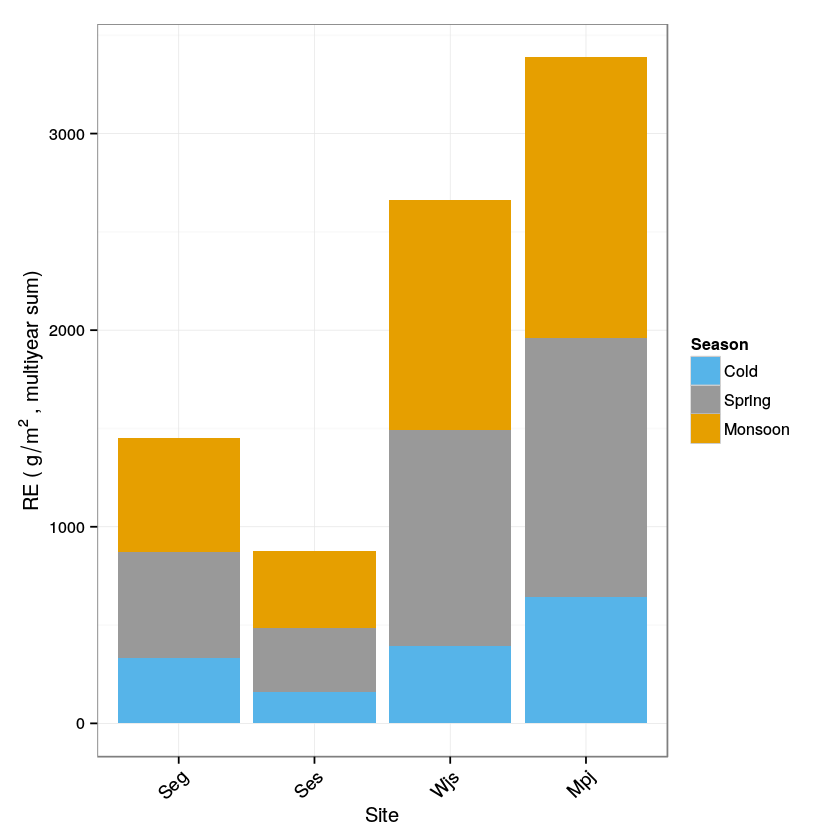

In [177]:
# Look at cumulative RE over full timeseries period, divided into the 3 seasons
RE.m <- melt(clean_rename(RE_daily), id.vars='season')
RE.m <- subset(RE.m, subset=(variable != 'year_w'))
RE.m <- ddply(RE.m, .(variable, season), summarise, sum = sum(value, na.rm = T))

RE_seas_multiyr <- ggplot(RE.m, aes(x=variable, y=sum, fill=factor(season))) +
  geom_bar(stat='identity') + xlab('Site') + 
  ylab(bquote('RE ('~ g/m^2 ~', multiyear sum)')) +
  theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
  scale_fill_manual(values=c("#56B4E9", "#999999", "#E69F00"), 
                    name="Season")
RE_seas_multiyr

## Precipitation

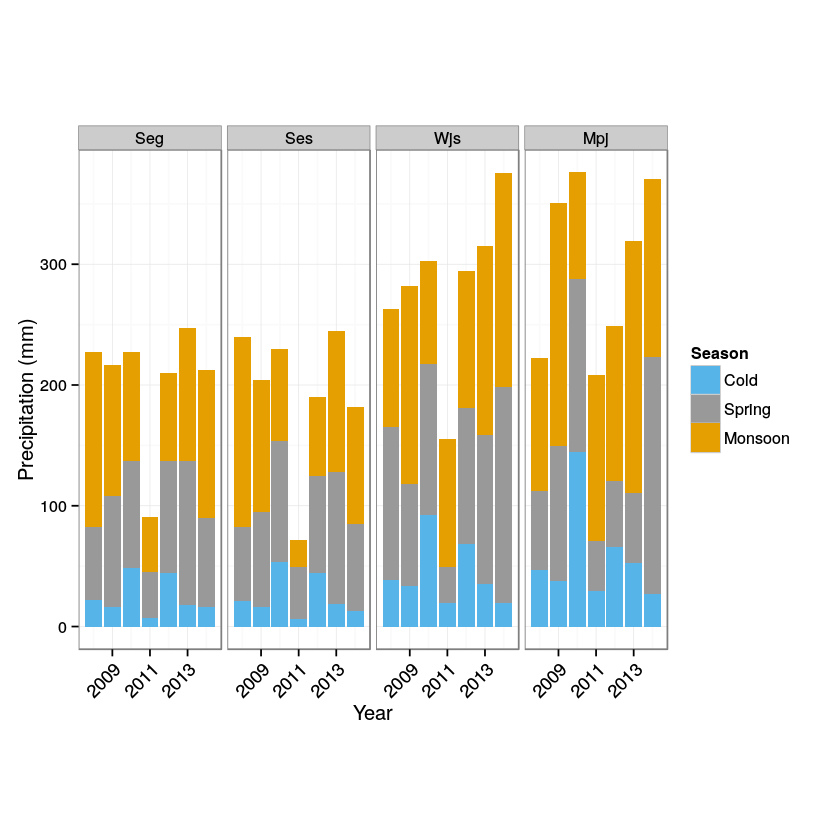

In [178]:
# Look at cumulative gauge Precip over a 6 year period, divided into the 3 seasons
gaugeP.m <- melt(clean_rename(P_gauge_daily), id.vars=c('season', 'year_w'))
#print(P.m)
gaugeP.m <- ddply(gaugeP.m, .(variable, season, year_w), summarise, sum = sum(value, na.rm = TRUE))

P_seas_by_yr <- ggplot(gaugeP.m, aes(x=year_w, y=sum, fill=factor(season))) +
  geom_bar(stat='identity') + facet_wrap(~ variable, nrow=1) +
  xlab('Year') + ylab('Precipitation (mm)') + 
  theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
  scale_fill_manual(values=c("#56B4E9", "#999999", "#E69F00"), name="Season") +
  theme(aspect.ratio=3.5)
P_seas_by_yr

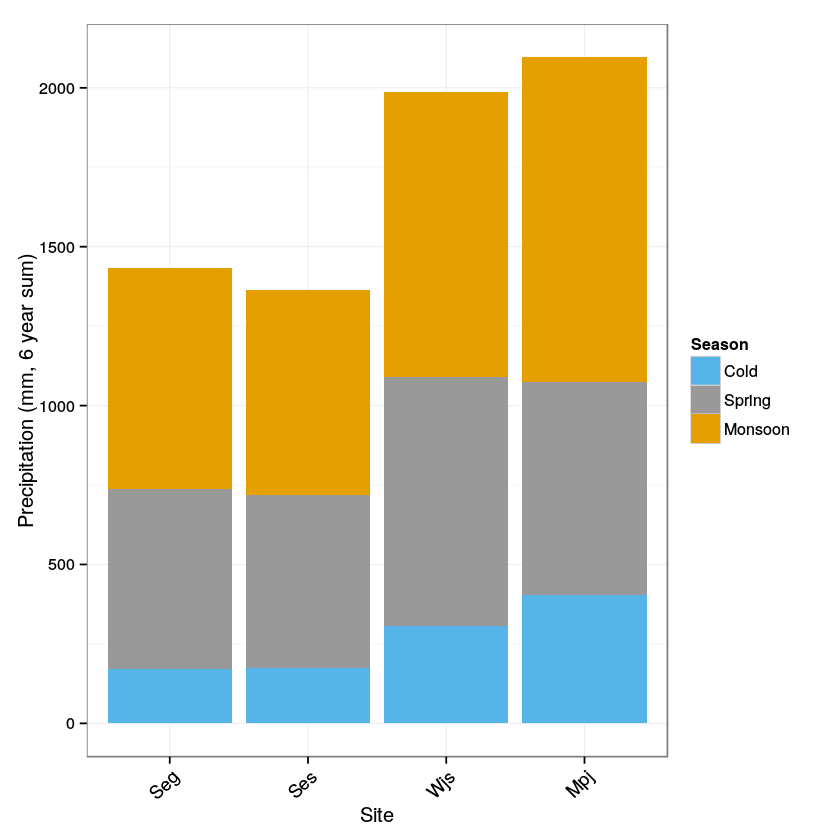

In [179]:
P.m <- melt(clean_rename(P_gauge_daily), id.vars='season')
P.m <- subset(P.m, subset=(variable != 'year_w'))
P.m <- ddply(P.m, .(variable, season), summarise, sum = sum(value, na.rm = T))

P_seas_multiyr <- ggplot(P.m, aes(x=variable, y=sum, fill=factor(season))) +
  geom_bar(stat='identity') + xlab('Site') + ylab('Precipitation (mm, 6 year sum)') +
  theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
  scale_fill_manual(values=c("#56B4E9", "#999999", "#E69F00"), 
                    name="Season")
P_seas_multiyr

In [180]:
# Look at cumulative PRISM Precip over a 6 year period, divided into the 3 seasons
#prismP.m <- melt(P_PRISM_daily, id.vars=c('season', 'year_w'))
#prismP.m <- ddply(prismP.m, .(variable, season, year_w), summarise, sum = sum(value, na.rm = T))

#P_seas_by_yr <- ggplot(prismP.m, aes(x=year_w, y=sum, fill=factor(season))) +
#  geom_bar(stat='identity') + facet_wrap(~ variable, nrow=1) +
#  xlab('Year') + ylab('Precipitation (mm)') + 
#  theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
#  scale_fill_manual(values=c("#56B4E9", "#999999", "#E69F00"), name="Season") +
#  theme(aspect.ratio=3.5)
#P_seas_by_yr

In [203]:
printfigs(P_seas_multiyr, 'P_seas_multiyr.svg', outpath, 5, 4.5)
printfigs(GPP_seas_by_yr, 'GPP_seas_by_yr.svg', outpath, 9, 4)
printfigs(RE_seas_by_yr, 'RE_seas_by_yr.svg', outpath, 9, 4)
printfigs(ET_seas_by_yr, 'ET_seas_by_yr.svg', outpath, 9, 4)
printfigs(NEE_seas_by_yr, 'NEE_seas_by_yr.svg', outpath, 9, 4)
printfigs(P_seas_by_yr, 'P_seas_by_yr.svg', outpath, 9, 4)

pdf 
  2

pdf 
  2

pdf 
  2

pdf 
  2

pdf 
  2

pdf 
  2

## Soil water content

Warning message:
: Removed 7 rows containing missing values (geom_path).Warning message:
: Removed 4 rows containing missing values (geom_path).Warning message:
: Removed 7 rows containing missing values (geom_path).Warning message:
: Removed 2 rows containing missing values (geom_path).

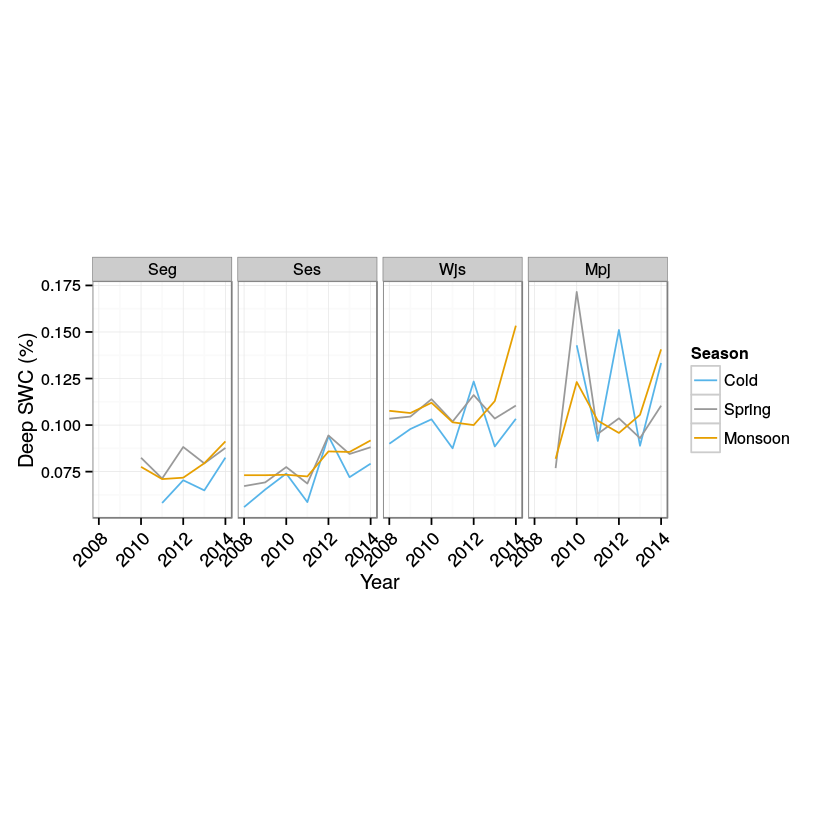

Warning message:
: Removed 7 rows containing missing values (geom_path).Warning message:
: Removed 2 rows containing missing values (geom_path).

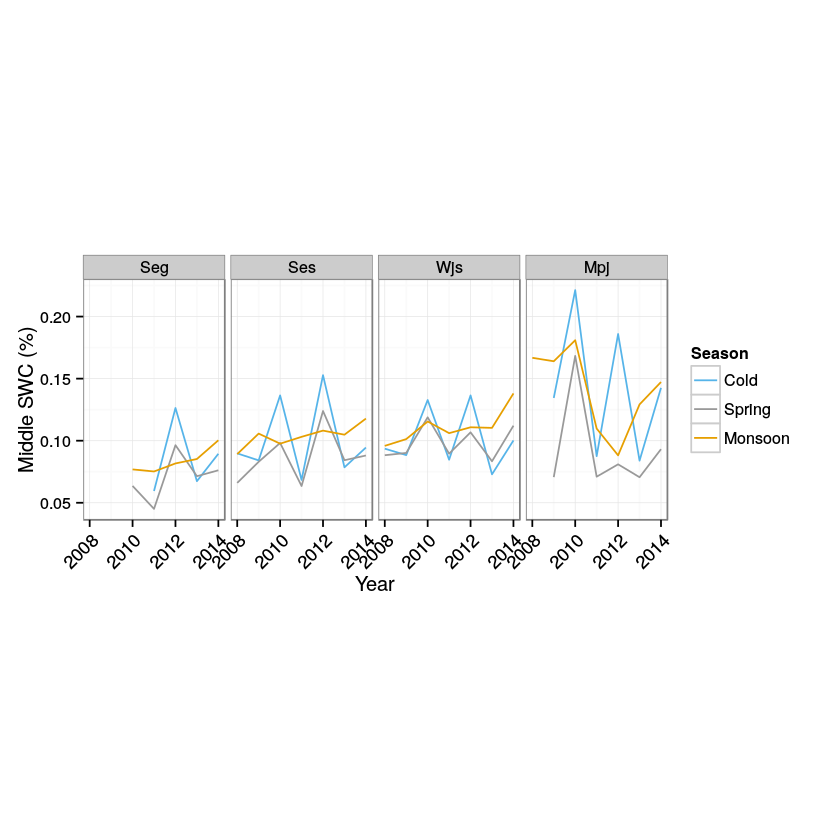

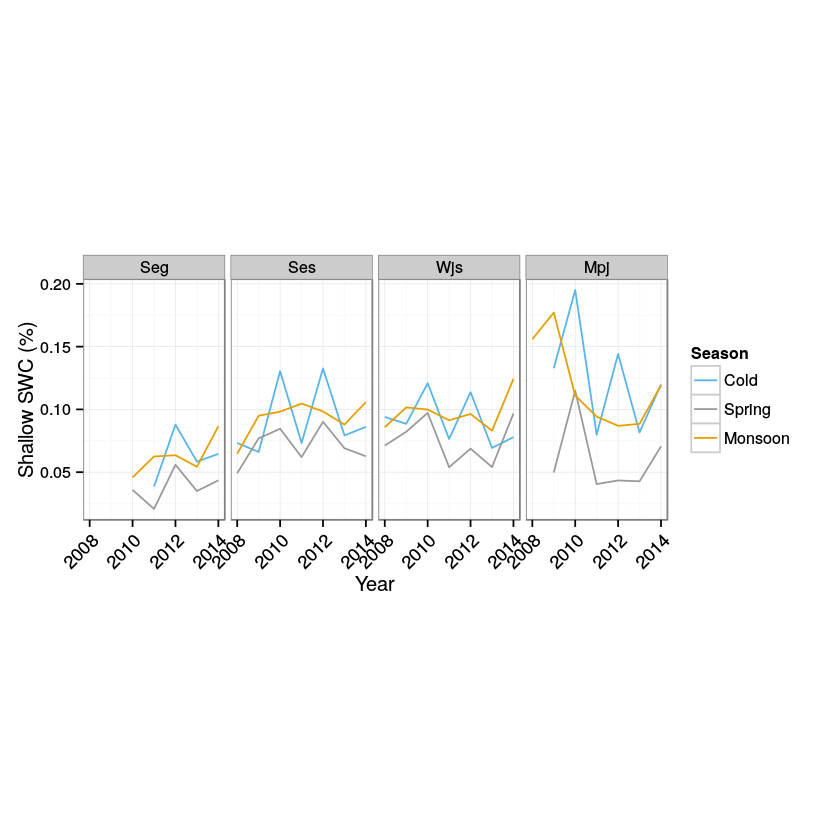

In [204]:
# Look at cumulative gauge Precip over a 6 year period, divided into the 3 seasons
deepSWC.m <- melt(clean_rename(deep_swc), id.vars=c('season', 'year_w'))
deepSWC.m <- ddply(deepSWC.m, .(variable, season, year_w), summarise, mean = median(value, na.rm = TRUE))

SWC_seas_deep <- ggplot(deepSWC.m, aes(x=year_w, y=mean, color=factor(season))) +
  geom_line(stat='identity') + facet_wrap(~variable, nrow=1) + 
  xlab('Year') + ylab(bquote('Deep SWC (%)')) +
  theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
  scale_color_manual(values=c("#56B4E9", "#999999", "#E69F00"), name="Season") +
    theme(aspect.ratio=1.7)
SWC_seas_deep

midSWC.m <- melt(clean_rename(mid_swc), id.vars=c('season', 'year_w'))
midSWC.m <- ddply(midSWC.m, .(variable, season, year_w), summarise, mean = median(value, na.rm = TRUE))

SWC_seas_mid <- ggplot(midSWC.m, aes(x=year_w, y=mean, color=factor(season))) +
  geom_line(stat='identity') + facet_wrap(~variable, nrow=1) + 
  xlab('Year') + ylab(bquote('Middle SWC (%)')) +
  theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
  scale_color_manual(values=c("#56B4E9", "#999999", "#E69F00"), name="Season") +
    theme(aspect.ratio=1.7)
SWC_seas_mid

shallSWC.m <- melt(clean_rename(shall_swc), id.vars=c('season', 'year_w'))
shallSWC.m <- ddply(shallSWC.m, .(variable, season, year_w), summarise, mean = median(value, na.rm = TRUE))

SWC_seas_shall <- ggplot(shallSWC.m, aes(x=year_w, y=mean, color=factor(season))) +
  geom_line(stat='identity') + facet_wrap(~variable, nrow=1) + 
  xlab('Year') + ylab(bquote('Shallow SWC (%)')) +
  theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
  scale_color_manual(values=c("#56B4E9", "#999999", "#E69F00"), name="Season") +
    theme(aspect.ratio=1.7)
SWC_seas_shall

In [205]:
printfigs(SWC_seas_deep, 'SWC_seas_deep.svg', outpath, 9, 4)

Warning message:
: Removed 7 rows containing missing values (geom_path).Warning message:
: Removed 4 rows containing missing values (geom_path).

pdf 
  2

## Regression analysis

In [183]:
# Get seasonal FC totals for each season at all sites and yearly total
get_water_flux_dep <- function(df_daily){
    flux.m <- melt(df_daily, id.vars=c('season', 'year_w'))
    flux_tot <- ddply(flux.m, .(variable, year_w),
                      summarise, year_flux_tot = sum(value, na.rm = T))
    flux_wyr_seas.m <- ddply(flux.m, .(variable, season, year_w),
                             summarise, year_seas_tot = sum(value, na.rm = T))
  
    # subset spring flux
    flux_spring <- subset(flux_wyr_seas.m, subset=(season=='Spring'))
    flux_spring <- rename(flux_spring, c("year_seas_tot"="Spring_flux_tot"))
    flux_spring$season <- NULL
  
    # subset monsoon flux
    flux_monsoon <- subset(flux_wyr_seas.m, subset=(season=='Monsoon'))
    flux_monsoon <- rename(flux_monsoon, c("year_seas_tot"="Monsoon_flux_tot"))
    flux_monsoon$season <- NULL
  
    # Get seasonal Precip totals for each season at all sites
    P.m <- melt(clean_rename(P_gauge_daily), id.vars=c('season', 'year_w'))
    P_wyr_seas.m <- ddply(P.m, .(variable, season, year_w),
                        summarise, P_tot = sum(value, na.rm = T))

  
    # Merge in flux_spring, flux_monsoon, and flux_tot by site/year
    P_dep <- P_wyr_seas.m
    P_dep <- merge(P_dep, flux_tot, by=c('variable', 'year_w'))
    P_dep <- merge(P_dep, flux_spring, by=c('variable', 'year_w'))
    P_dep <- merge(P_dep, flux_monsoon, by=c('variable', 'year_w'))
    
    # Merge in SWC with flux_spring, flux_monsoon, and flux_tot by site/year
    shall.m <- melt(clean_rename(shall_swc), id.vars=c('season', 'year_w'))
    shallSWC_y_s.m <- ddply(shall.m, .(variable, season, year_w), summarise, mean = mean(value, na.rm = TRUE))
    mid.m <- melt(clean_rename(mid_swc), id.vars=c('season', 'year_w'))
    midSWC_y_s.m <- ddply(mid.m, .(variable, season, year_w), summarise, mean = mean(value, na.rm = TRUE))
    deep.m <- melt(clean_rename(deep_swc), id.vars=c('season', 'year_w'))
    deepSWC_y_s.m <- ddply(deep.m, .(variable, season, year_w), summarise, mean = mean(value, na.rm = TRUE))
    
    
    SwcD_dep <- deepSWC_y_s.m
    SwcD_dep <- merge(SwcD_dep, flux_tot, by=c('variable', 'year_w'))
    SwcD_dep <- merge(SwcD_dep, flux_spring, by=c('variable', 'year_w'))
    SwcD_dep <- merge(SwcD_dep, flux_monsoon, by=c('variable', 'year_w'))
    SwcM_dep <- midSWC_y_s.m
    SwcM_dep <- merge(SwcM_dep, flux_tot, by=c('variable', 'year_w'))
    SwcM_dep <- merge(SwcM_dep, flux_spring, by=c('variable', 'year_w'))
    SwcM_dep <- merge(SwcM_dep, flux_monsoon, by=c('variable', 'year_w'))
    SwcS_dep <- shallSWC_y_s.m
    SwcS_dep <- merge(SwcS_dep, flux_tot, by=c('variable', 'year_w'))
    SwcS_dep <- merge(SwcS_dep, flux_spring, by=c('variable', 'year_w'))
    SwcS_dep <- merge(SwcS_dep, flux_monsoon, by=c('variable', 'year_w'))
  
    return(list(P_dep, SwcD_dep, SwcM_dep, SwcS_dep))
}

## Get flux dependence datasets

In [184]:
NEE_list <- get_water_flux_dep(clean_rename(FC_daily))
NEE_P_dep <- NEE_list[[1]]
NEE_SWCd_dep <- NEE_list[[2]]
NEE_SWCm_dep <- NEE_list[[3]]
NEE_SWCs_dep <- NEE_list[[4]]
#print(NEE_P_dep)

In [185]:
GPP_list <- get_water_flux_dep(clean_rename(GPP_daily))
GPP_P_dep <- GPP_list[[1]]
GPP_SWCd_dep <- GPP_list[[2]]
GPP_SWCm_dep <- GPP_list[[3]]
GPP_SWCs_dep <- GPP_list[[4]]
#print(GPP_P_dep)

In [186]:
ET_list <- get_water_flux_dep(clean_rename(ET_daily))
ET_P_dep <- GPP_list[[1]]
ET_SWCd_dep <- GPP_list[[2]]
ET_SWCm_dep <- GPP_list[[3]]
ET_SWCs_dep <- GPP_list[[4]]

## Define a plot for flux dependence

In [187]:
#  Yearly, Spring, and Monsoon fluxes vs cold season precip

multiRegPlot <- function(df, indVar_season, dep_varName, dep_vars, dep_varLabels, 
                         dep_varColors, xLabel, yLabel){
    subs <- subset(df, subset=(season==indVar_season))
    names(subs)[1]<-"Site"
    subs = melt(subs, measure.vars=dep_vars)
    plot <- ggplot(subs, aes_string(x=dep_varName, y='value', col='variable')) +
    geom_point(size=3) + stat_smooth(method=lm, alpha = 0.1) +
    facet_wrap(~ Site, scales = 'free') + xlab(xLabel) + 
    ylab(yLabel) +
    scale_colour_manual(values=dep_varColors,
                      labels=dep_varLabels,
                      name="Season")
    return(plot)
}

## Cold season GPP dependence

Warning message:
: Removed 3 rows containing missing values (stat_smooth).Warning message:
: Removed 3 rows containing missing values (stat_smooth).Warning message:
: Removed 3 rows containing missing values (stat_smooth).Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 9 rows containing missing values (geom_point).Warning message:
: Removed 6 rows containing missing values (geom_point).

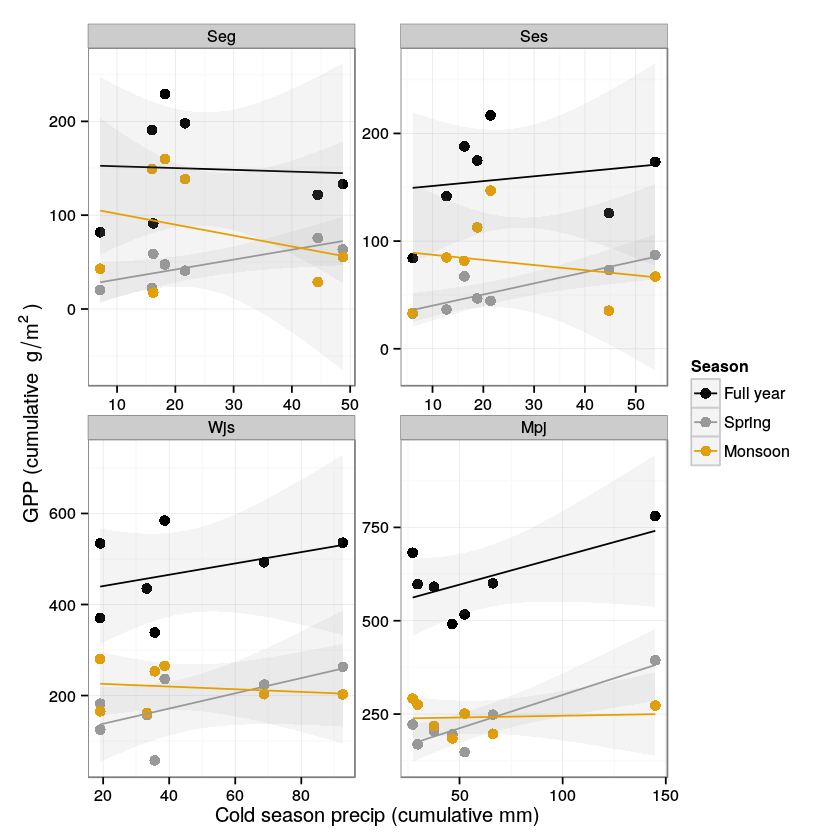

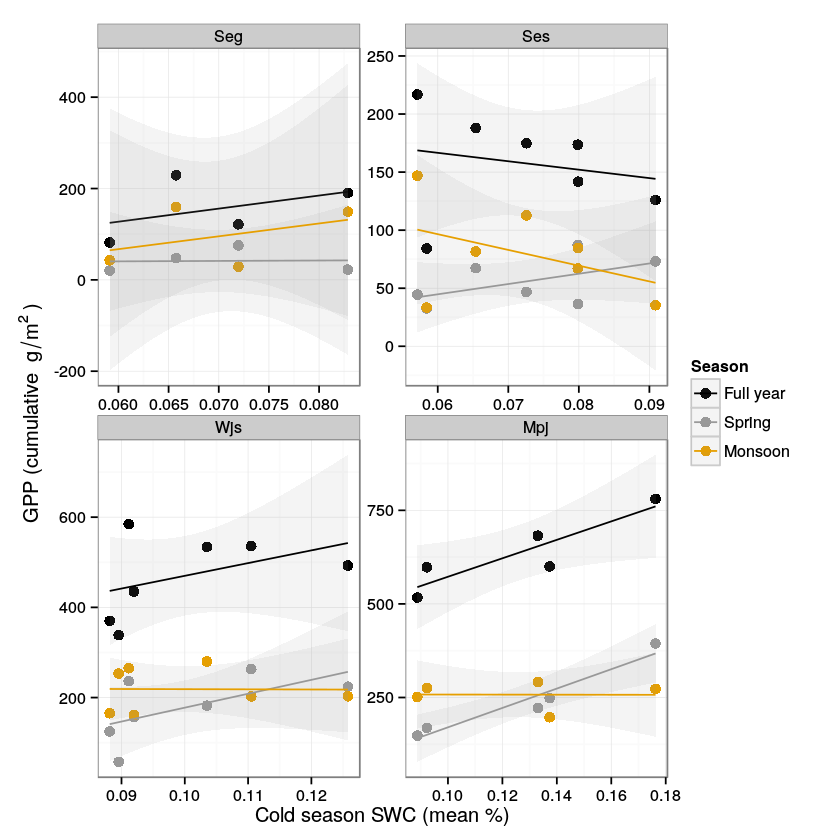

In [188]:
GPP_on_coldP <- multiRegPlot(GPP_P_dep, 'Cold', 'P_tot',
                             c("year_flux_tot", "Spring_flux_tot", "Monsoon_flux_tot"),
                             c("Full year", "Spring", "Monsoon"), c("black", "#999999", "#E69F00"),
                             'Cold season precip (cumulative mm)',
                             bquote('GPP (cumulative '~ g/m^2 ~')'))
GPP_on_coldP

GPP_on_coldS <- multiRegPlot(GPP_SWCd_dep, 'Cold', 'mean',
                             c("year_flux_tot", "Spring_flux_tot", "Monsoon_flux_tot"),
                             c("Full year", "Spring", "Monsoon"), c("black", "#999999", "#E69F00"),
                             'Cold season SWC (mean %)',
                             bquote('GPP (cumulative '~ g/m^2 ~')'))
GPP_on_coldS

## Spring GPP dependence

Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 1 rows containing missing values (stat_smooth).Warning message:
: Removed 1 rows containing missing values (stat_smooth).Warning message:
: Removed 1 rows containing missing values (stat_smooth).Warning message:
: Removed 6 rows containing missing values (geom_point).Warning message:
: Removed 3 rows containing missing values (geom_point).

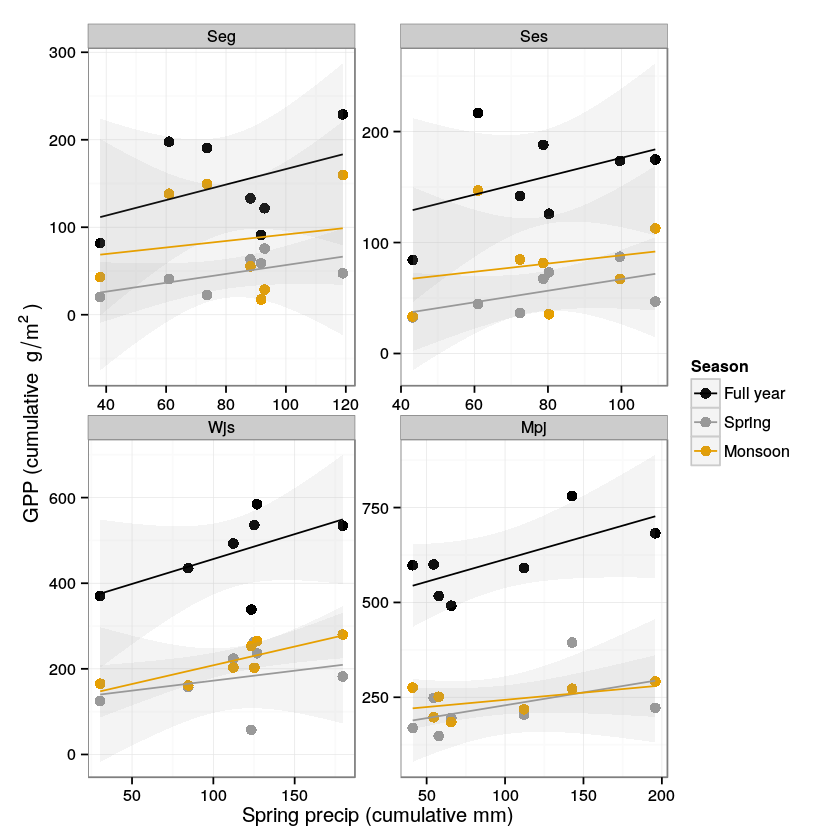

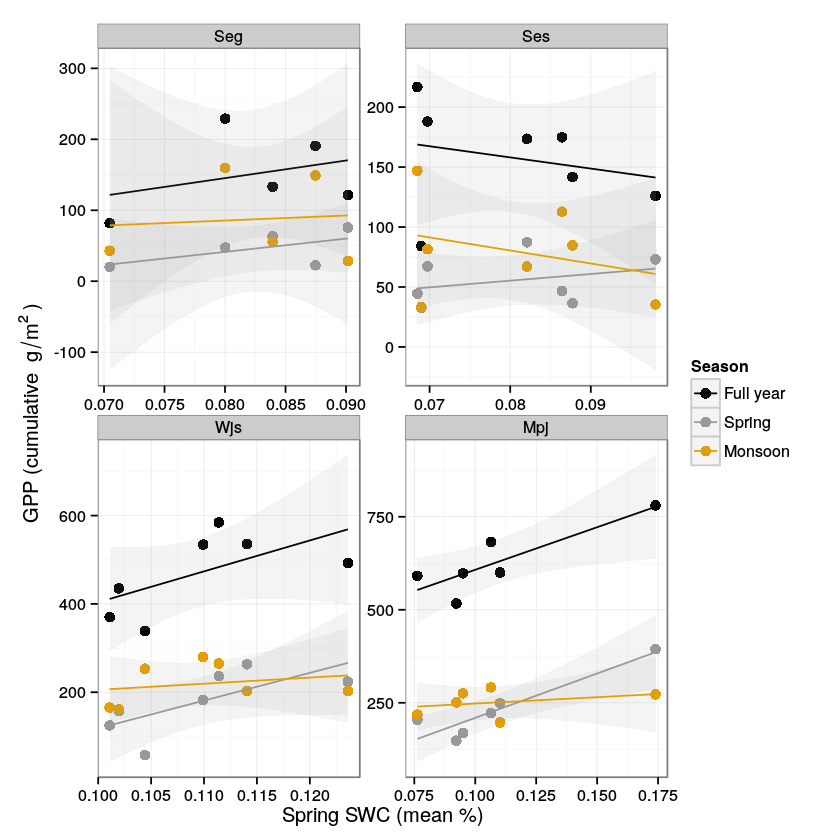

In [189]:
#  Yearly, Spring, and Monsoon fluxes vs spring season precip
GPP_on_springP <- multiRegPlot(GPP_P_dep, 'Spring', 'P_tot',
                             c("year_flux_tot", "Spring_flux_tot", "Monsoon_flux_tot"),
                             c("Full year", "Spring", "Monsoon"), c("black", "#999999", "#E69F00"),
                             'Spring precip (cumulative mm)',
                             bquote('GPP (cumulative '~ g/m^2 ~')'))
GPP_on_springP

GPP_on_springS <- multiRegPlot(GPP_SWCd_dep, 'Spring', 'mean',
                             c("year_flux_tot", "Spring_flux_tot", "Monsoon_flux_tot"),
                             c("Full year", "Spring", "Monsoon"), c("black", "#999999", "#E69F00"),
                             'Spring SWC (mean %)',
                             bquote('GPP (cumulative '~ g/m^2 ~')'))
GPP_on_springS

## Monsoon GPP dependence

Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 4 rows containing missing values (geom_point).

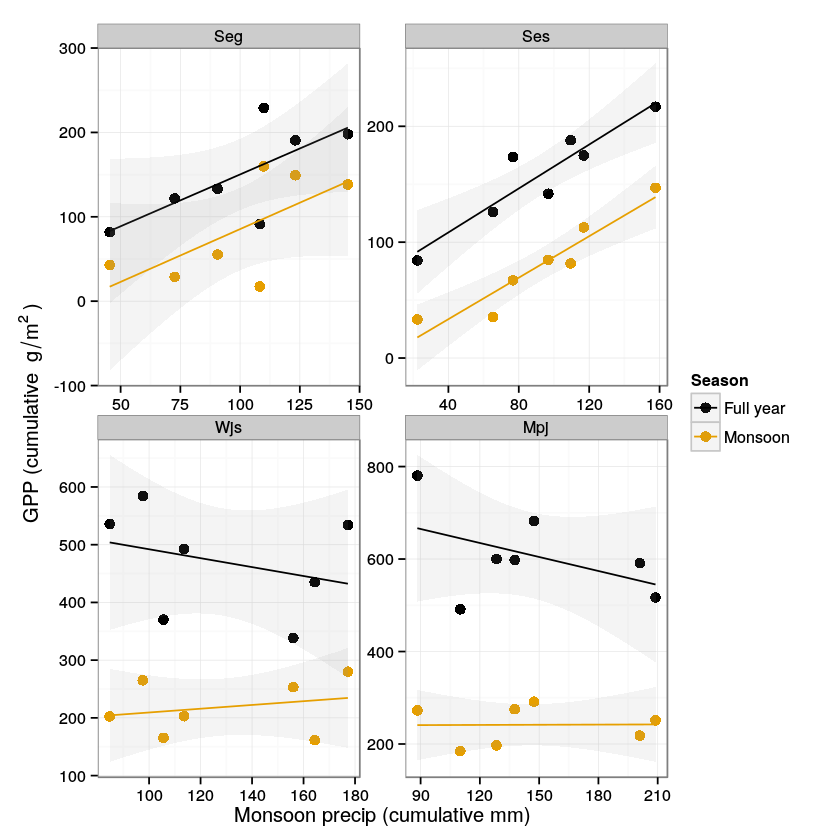

pdf 
  2

pdf 
  2

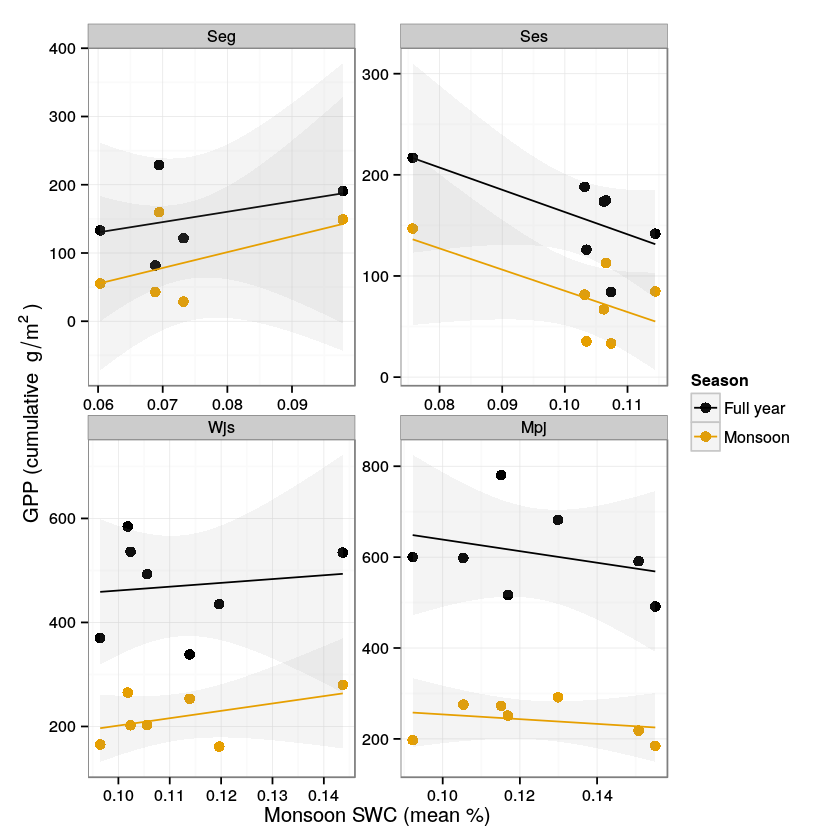

In [207]:
#  Yearly, Spring, and Monsoon fluxes vs monsoon season precip

GPP_on_monsoonP <- multiRegPlot(GPP_P_dep, 'Monsoon', 'P_tot', c("year_flux_tot", "Monsoon_flux_tot"),
                    c("Full year", "Monsoon"), c("black", "#E69F00"),
                     'Monsoon precip (cumulative mm)', bquote('GPP (cumulative '~ g/m^2 ~')'))
GPP_on_monsoonP

GPP_on_monsoonS <- multiRegPlot(GPP_SWCs_dep, 'Monsoon', 'mean', c("year_flux_tot", "Monsoon_flux_tot"),
                    c("Full year", "Monsoon"), c("black", "#E69F00"),
                     'Monsoon SWC (mean %)', bquote('GPP (cumulative '~ g/m^2 ~')'))
GPP_on_monsoonS

printfigs(GPP_on_monsoonP, 'GPP_on_monsoonP.svg', outpath, 6.5, 5)
printfigs(GPP_on_coldP, 'GPP_on_coldP.svg', outpath, 6.5, 5)

## Cold season NEE dependence

Warning message:
: Removed 3 rows containing missing values (stat_smooth).Warning message:
: Removed 3 rows containing missing values (stat_smooth).Warning message:
: Removed 3 rows containing missing values (stat_smooth).Warning message:
: Removed 1 rows containing missing values (stat_smooth).Warning message:
: Removed 1 rows containing missing values (stat_smooth).Warning message:
: Removed 1 rows containing missing values (stat_smooth).Warning message:
: Removed 9 rows containing missing values (geom_point).Warning message:
: Removed 3 rows containing missing values (geom_point).

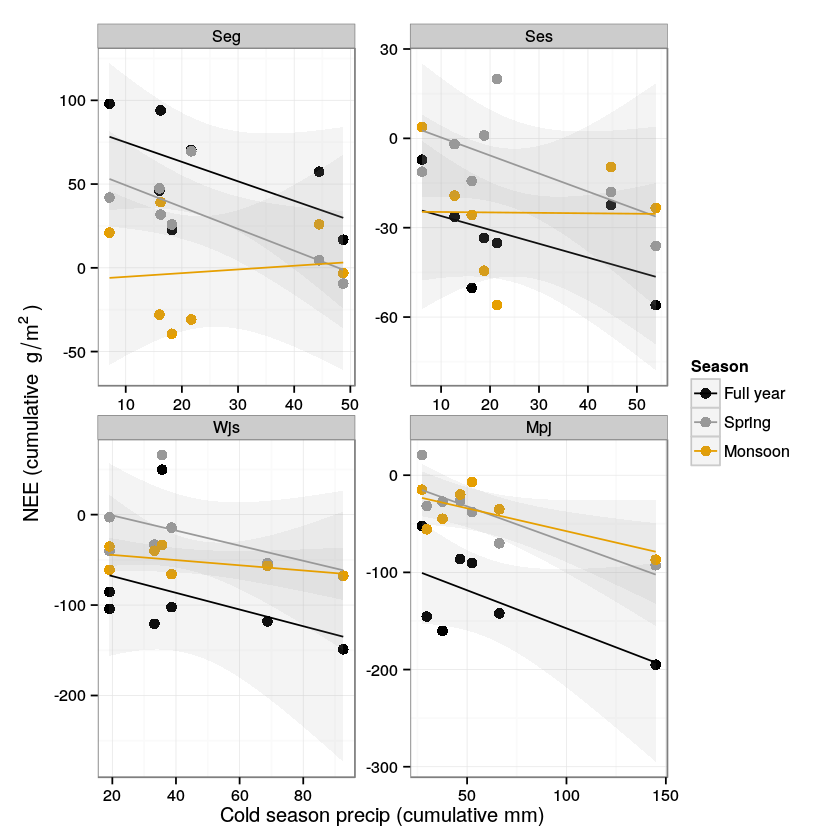

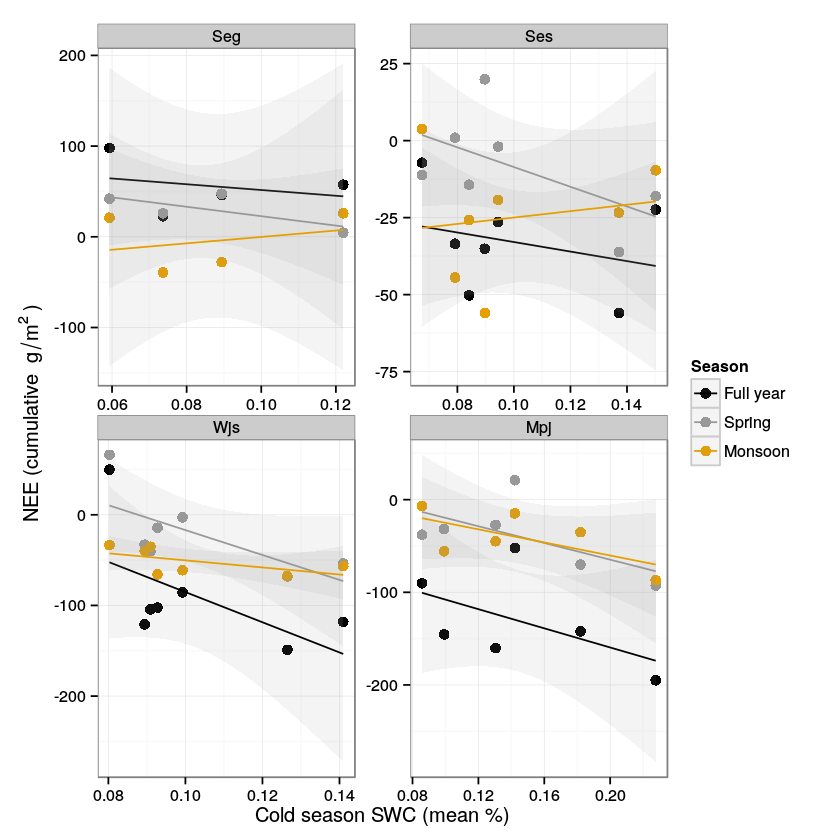

In [191]:
NEE_on_coldP <- multiRegPlot(NEE_P_dep, 'Cold', 'P_tot',
                             c("year_flux_tot", "Spring_flux_tot", "Monsoon_flux_tot"),
                             c("Full year", "Spring", "Monsoon"), c("black", "#999999", "#E69F00"),
                             'Cold season precip (cumulative mm)',
                             bquote('NEE (cumulative '~ g/m^2 ~')'))
NEE_on_coldP

NEE_on_coldS <- multiRegPlot(NEE_SWCm_dep, 'Cold', 'mean',
                             c("year_flux_tot", "Spring_flux_tot", "Monsoon_flux_tot"),
                             c("Full year", "Spring", "Monsoon"), c("black", "#999999", "#E69F00"),
                             'Cold season SWC (mean %)',
                             bquote('NEE (cumulative '~ g/m^2 ~')'))
NEE_on_coldS

## Spring NEE dependence

Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 1 rows containing missing values (stat_smooth).Warning message:
: Removed 1 rows containing missing values (stat_smooth).Warning message:
: Removed 1 rows containing missing values (stat_smooth).Warning message:
: Removed 6 rows containing missing values (geom_point).Warning message:
: Removed 3 rows containing missing values (geom_point).

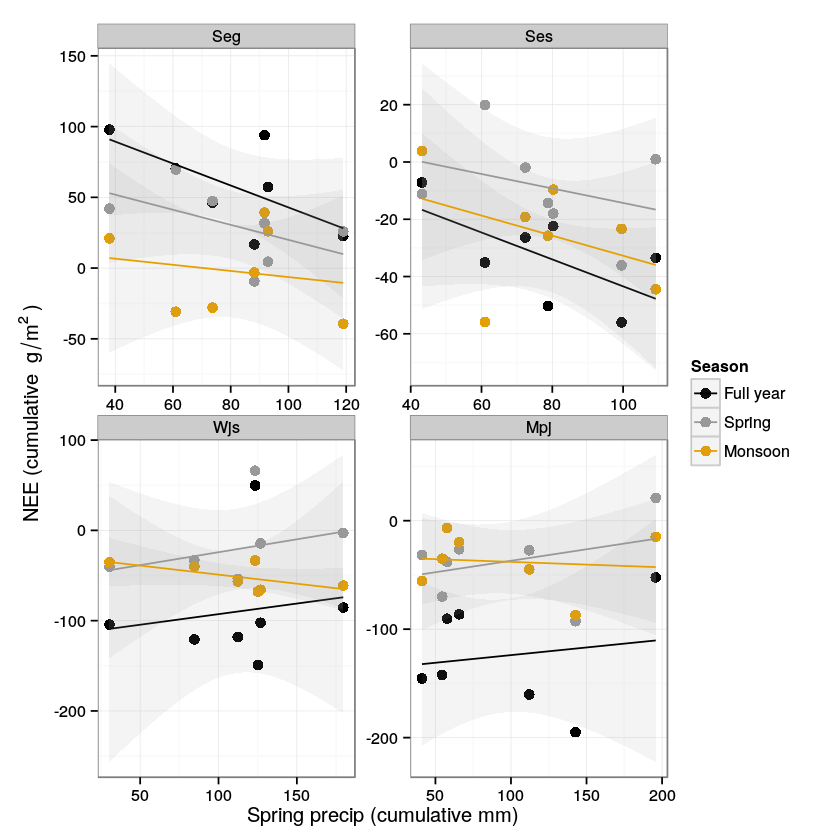

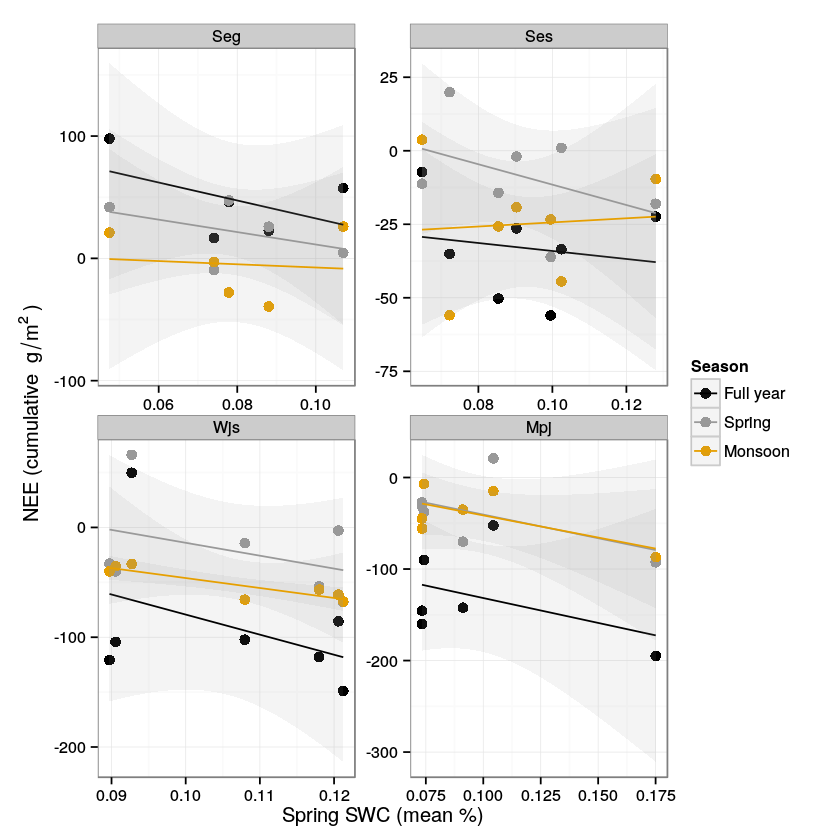

In [192]:
NEE_on_springP <- multiRegPlot(NEE_P_dep, 'Spring', 'P_tot',
                             c("year_flux_tot", "Spring_flux_tot", "Monsoon_flux_tot"),
                             c("Full year", "Spring", "Monsoon"), c("black", "#999999", "#E69F00"),
                             'Spring precip (cumulative mm)',
                             bquote('NEE (cumulative '~ g/m^2 ~')'))
NEE_on_springP

NEE_on_springS <- multiRegPlot(NEE_SWCm_dep, 'Spring', 'mean',
                             c("year_flux_tot", "Spring_flux_tot", "Monsoon_flux_tot"),
                             c("Full year", "Spring", "Monsoon"), c("black", "#999999", "#E69F00"),
                             'Spring SWC (mean %)',
                             bquote('NEE (cumulative '~ g/m^2 ~')'))
NEE_on_springS

## Monsoon NEE dependence

Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 4 rows containing missing values (geom_point).

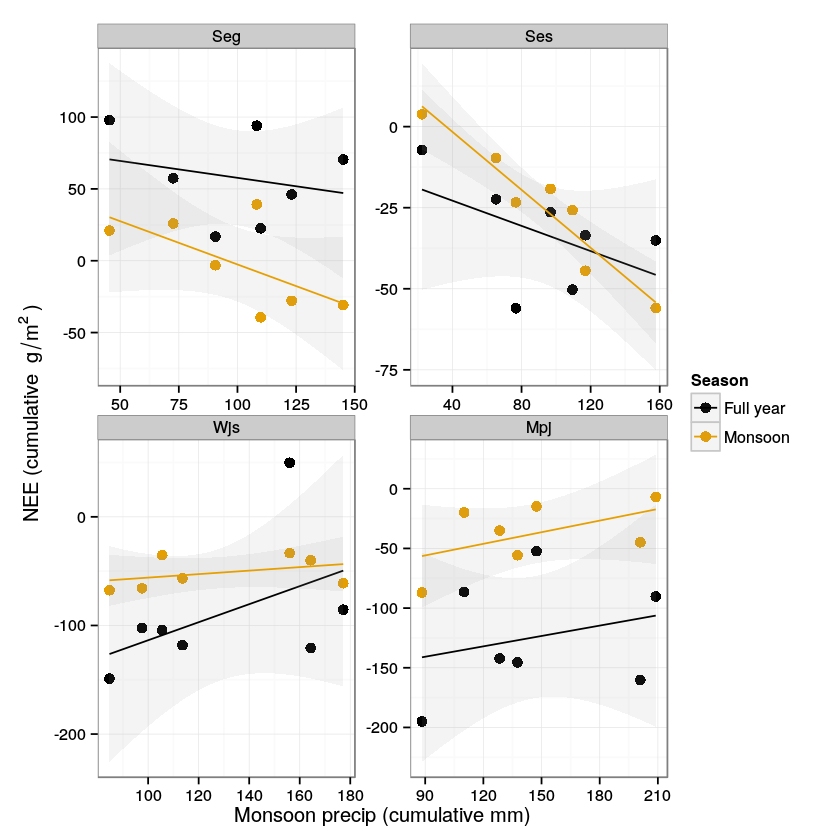

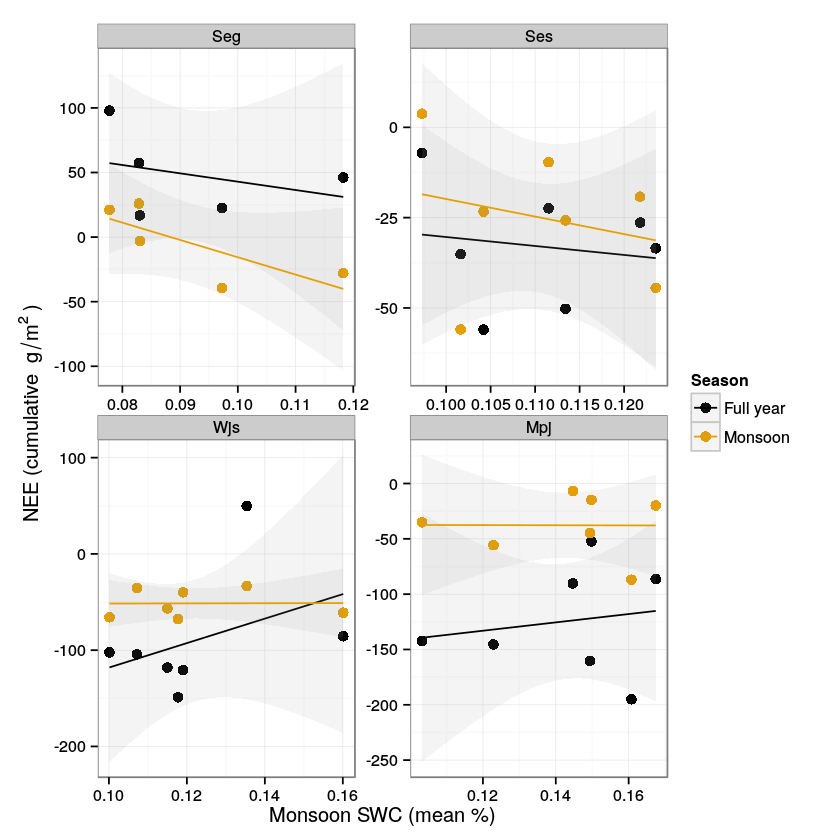

In [193]:
NEE_on_monsoonP <- multiRegPlot(NEE_P_dep, 'Monsoon', 'P_tot', c("year_flux_tot", "Monsoon_flux_tot"),
                    c("Full year", "Monsoon"), c("black", "#E69F00"),
                     'Monsoon precip (cumulative mm)', bquote('NEE (cumulative '~ g/m^2 ~')'))
NEE_on_monsoonP

NEE_on_monsoonS <- multiRegPlot(NEE_SWCm_dep, 'Monsoon', 'mean', c("year_flux_tot", "Monsoon_flux_tot"),
                    c("Full year", "Monsoon"), c("black", "#E69F00"),
                     'Monsoon SWC (mean %)', bquote('NEE (cumulative '~ g/m^2 ~')'))
NEE_on_monsoonS

## Cold season ET dependence

Warning message:
: Removed 3 rows containing missing values (stat_smooth).Warning message:
: Removed 3 rows containing missing values (stat_smooth).Warning message:
: Removed 3 rows containing missing values (stat_smooth).Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 9 rows containing missing values (geom_point).Warning message:
: Removed 6 rows containing missing values (geom_point).

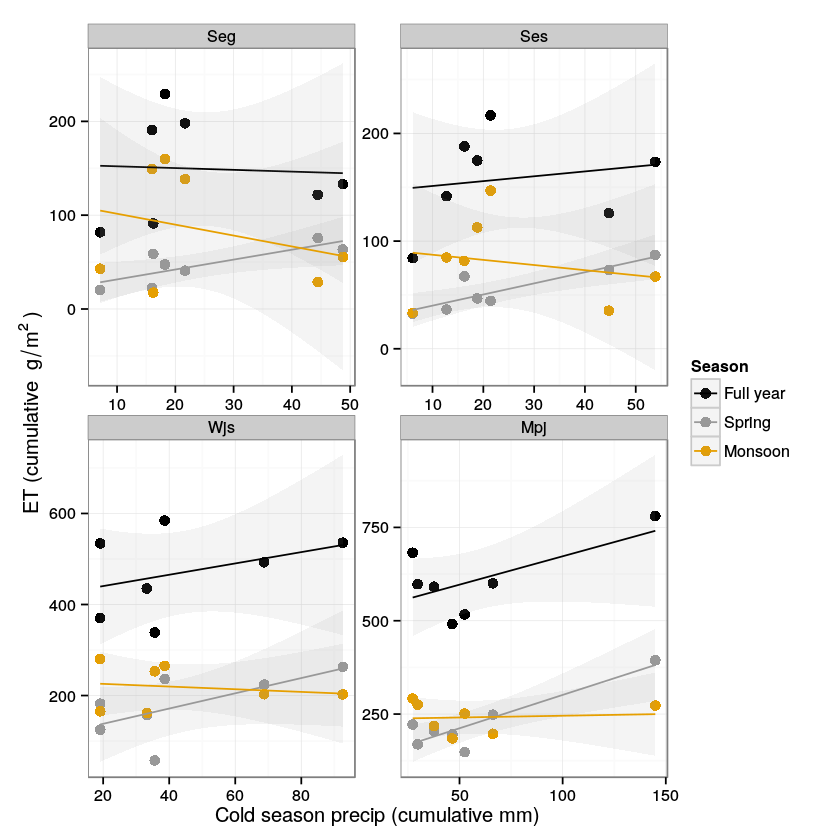

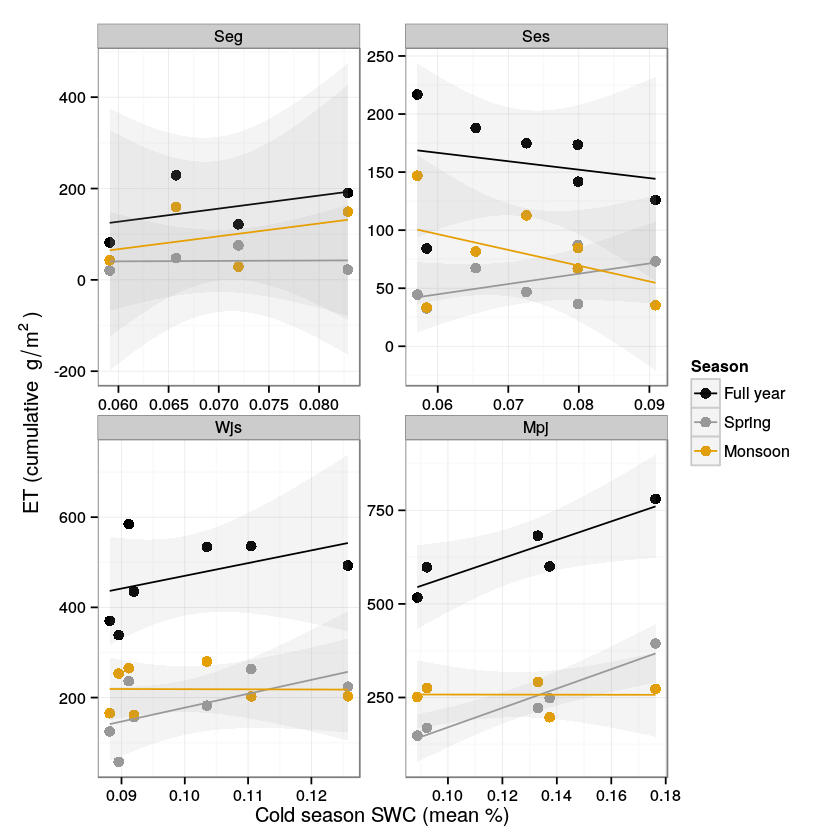

In [194]:
ET_on_coldP <- multiRegPlot(ET_P_dep, 'Cold', 'P_tot',
                             c("year_flux_tot", "Spring_flux_tot", "Monsoon_flux_tot"),
                             c("Full year", "Spring", "Monsoon"), c("black", "#999999", "#E69F00"),
                             'Cold season precip (cumulative mm)',
                             bquote('ET (cumulative '~ g/m^2 ~')'))
ET_on_coldP

ET_on_coldS <- multiRegPlot(ET_SWCd_dep, 'Cold', 'mean',
                             c("year_flux_tot", "Spring_flux_tot", "Monsoon_flux_tot"),
                             c("Full year", "Spring", "Monsoon"), c("black", "#999999", "#E69F00"),
                             'Cold season SWC (mean %)',
                             bquote('ET (cumulative '~ g/m^2 ~')'))
ET_on_coldS

## Spring ET dependence

Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 1 rows containing missing values (stat_smooth).Warning message:
: Removed 1 rows containing missing values (stat_smooth).Warning message:
: Removed 1 rows containing missing values (stat_smooth).Warning message:
: Removed 6 rows containing missing values (geom_point).Warning message:
: Removed 3 rows containing missing values (geom_point).

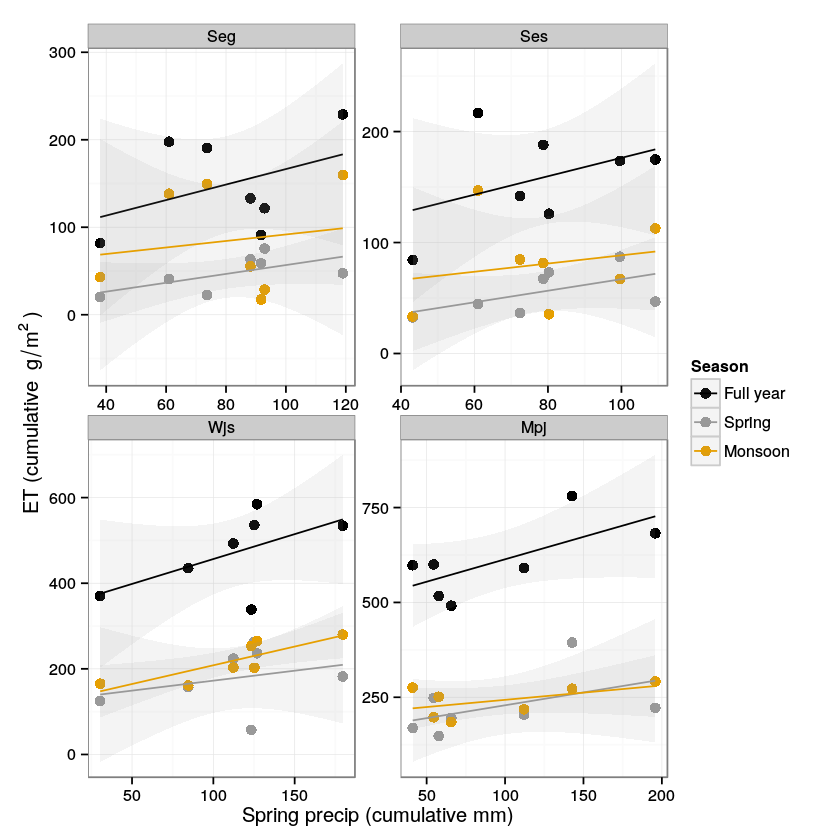

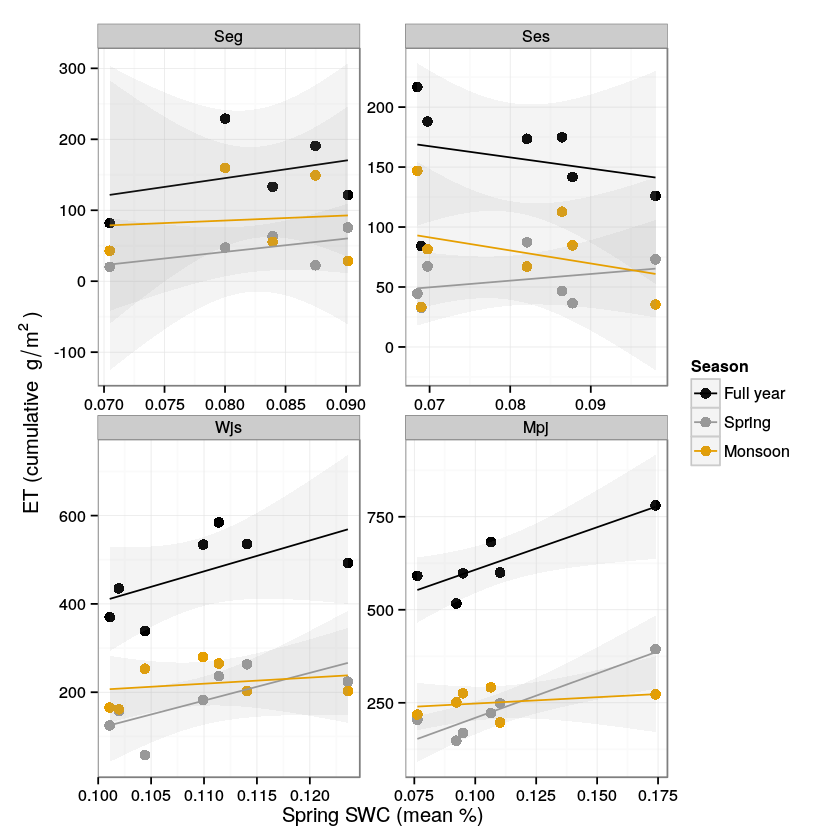

In [195]:
ET_on_springP <- multiRegPlot(ET_P_dep, 'Spring', 'P_tot',
                             c("year_flux_tot", "Spring_flux_tot", "Monsoon_flux_tot"),
                             c("Full year", "Spring", "Monsoon"), c("black", "#999999", "#E69F00"),
                             'Spring precip (cumulative mm)',
                             bquote('ET (cumulative '~ g/m^2 ~')'))
ET_on_springP

ET_on_springS <- multiRegPlot(ET_SWCd_dep, 'Spring', 'mean',
                             c("year_flux_tot", "Spring_flux_tot", "Monsoon_flux_tot"),
                             c("Full year", "Spring", "Monsoon"), c("black", "#999999", "#E69F00"),
                             'Spring SWC (mean %)',
                             bquote('ET (cumulative '~ g/m^2 ~')'))
ET_on_springS

## Monsoon ET dependence

Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 2 rows containing missing values (stat_smooth).Warning message:
: Removed 4 rows containing missing values (geom_point).

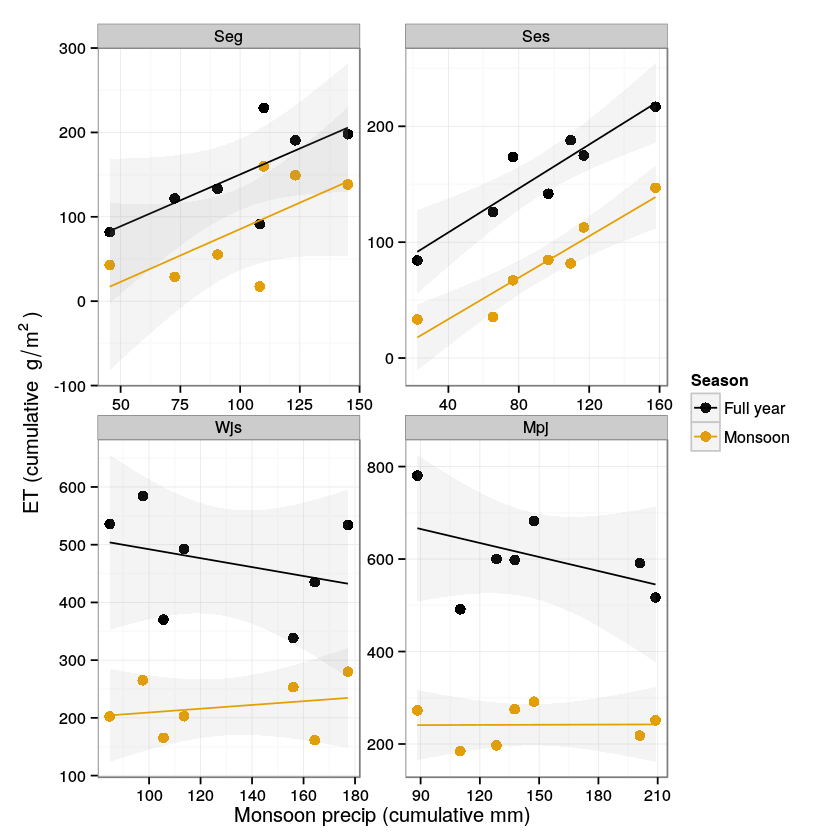

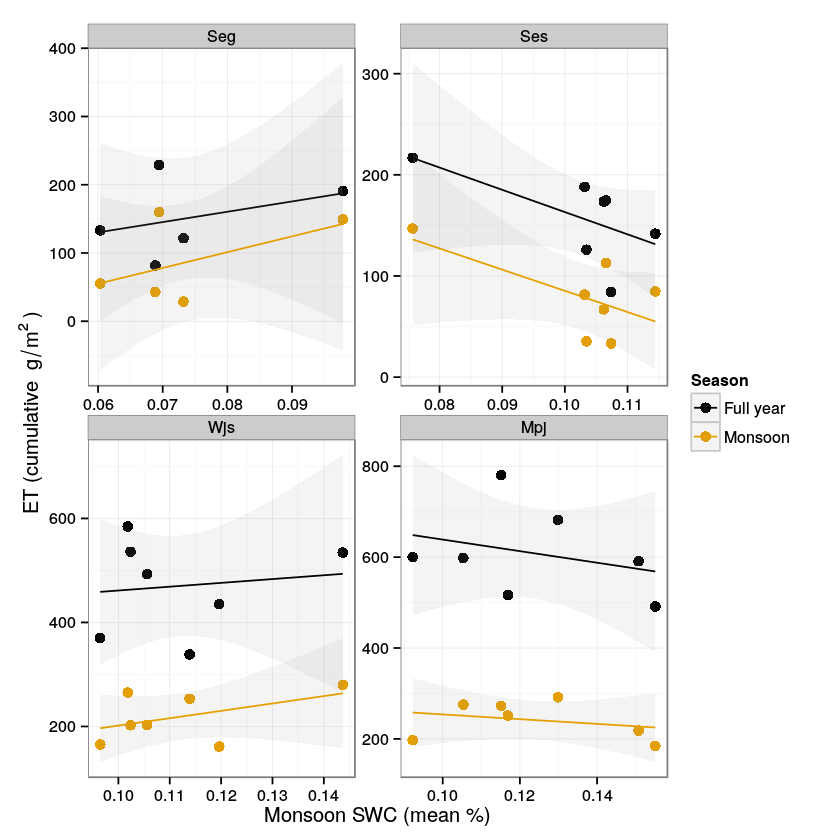

In [196]:
ET_on_monsoonP <- multiRegPlot(ET_P_dep, 'Monsoon', 'P_tot', c("year_flux_tot", "Monsoon_flux_tot"),
                    c("Full year", "Monsoon"), c("black", "#E69F00"),
                     'Monsoon precip (cumulative mm)', bquote('ET (cumulative '~ g/m^2 ~')'))
ET_on_monsoonP

ET_on_monsoonS <- multiRegPlot(ET_SWCs_dep, 'Monsoon', 'mean', c("year_flux_tot", "Monsoon_flux_tot"),
                    c("Full year", "Monsoon"), c("black", "#E69F00"),
                     'Monsoon SWC (mean %)', bquote('ET (cumulative '~ g/m^2 ~')'))
ET_on_monsoonS

In [197]:
# On to soil water content
deep <- grep('30_AVG', colnames(VWC_daily), value=T)
shallow <- grep('5_AVG', colnames(VWC_daily), value=T)

VWC_daily['Deep'] <- rowMeans(VWC_daily[deep], na.rm=T)
VWC_daily['Shallow'] <- rowMeans(VWC_daily[shallow], na.rm=T)


# Make a smaller dataset to melt
VWC <- VWC_daily[,c('year_month_mday','year_w','doy_w','season','Deep','Shallow')]
VWC.m <- melt(VWC, id.vars=c('year_month_mday', 'year_w', 'doy_w', 'season'))

VWC_ts <- ggplot(VWC.m, aes(x=as.Date(year_month_mday), y=value, color=variable)) +
  geom_line() + scale_color_manual(name="Soil depth",values=c("blue", "green")) +
  ylab('Volumetric Wate Content') + xlab('Date')

VWC_ts
printfigs(VWC_ts, 'VWC_ts.svg', 10, 2)

ERROR: Error in is.data.frame(x): object 'VWC_daily' not found


ERROR: Error in is.data.frame(x): object 'VWC_daily' not found


ERROR: Error in is.data.frame(x): object 'VWC_daily' not found


ERROR: Error in is.data.frame(x): object 'VWC_daily' not found


ERROR: Error in eval(expr, envir, enclos): object 'VWC_daily' not found


ERROR: Error in melt(VWC, id.vars = c("year_month_mday", "year_w", "doy_w", "season")): object 'VWC' not found


ERROR: Error in ggplot(VWC.m, aes(x = as.Date(year_month_mday), y = value, color = variable)): object 'VWC.m' not found


ERROR: Error in eval(expr, envir, enclos): object 'VWC_ts' not found


ERROR: Error in printfigs(VWC_ts, "VWC_ts.svg", 10, 2): object 'VWC_ts' not found


In [198]:
VWC.m <- ddply(VWC.m, .(variable, season, year_w),
               summarise, VWC_med = median(value, na.rm = T))

VWC_seas_by_yr <- ggplot(VWC.m, aes(x=year_w, y=VWC_med, fill=factor(season))) +
  geom_bar(stat='identity', position='dodge') + facet_wrap(~ variable, nrow=1) +
  xlab('Year') + ylab('Mean VWC') + 
  theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
  scale_fill_manual(values=c("#56B4E9", "#999999", "#E69F00"), 
                    name="Season")
VWC_seas_by_yr
#printfigs(VWC_seas_by_yr, 'VWC_seas_by_yr.svg', 6.5, 4)

ERROR: Error in empty(.data): object 'VWC.m' not found


ERROR: Error in ggplot(VWC.m, aes(x = year_w, y = VWC_med, fill = factor(season))): object 'VWC.m' not found


ERROR: Error in eval(expr, envir, enclos): object 'VWC_seas_by_yr' not found


In [199]:
GPP_sub <- subset(GPP_P_dep, subset=(year_w > 2008 & variable=='PJ woodland'))
VWC.m <- merge(VWC.m, GPP_sub, by=c('season', 'year_w'))

GPP_vs_VWC <- ggplot(VWC.m, aes(x=VWC_med, y=year_flux_tot, col=factor(season))) +
  geom_point(size=3) + stat_smooth(method=lm, alpha=0.1, fullrange=T) +
  facet_wrap(~variable.x, nrow=1) + xlab('Median VWC') + 
  ylab(bquote('Yearly GPP (cumulative '~ g/m^2 ~')')) +
  scale_colour_manual(values=c("#56B4E9", "#999999", "#E69F00"), 
                      name="Season")
GPP_vs_VWC
printfigs(GPP_vs_VWC, 'GPP_vs_VWC.svg', 6.5, 4)

ERROR: Error in merge(VWC.m, GPP_sub, by = c("season", "year_w")): object 'VWC.m' not found


ERROR: Error in ggplot(VWC.m, aes(x = VWC_med, y = year_flux_tot, col = factor(season))): object 'VWC.m' not found


ERROR: Error in eval(expr, envir, enclos): object 'GPP_vs_VWC' not found


ERROR: Error in printfigs(GPP_vs_VWC, "GPP_vs_VWC.svg", 6.5, 4): object 'GPP_vs_VWC' not found


In [200]:
# #  Yearly GPP vs total precip in each of 3 seasons
# ggplot(GPP_P_dep, aes(x=P_tot, y=year_flux_tot, col=factor(season))) +
#   geom_point() + facet_wrap(~ variable)
# 
# #  Spring NEE vs total precip in each of 3 seasons
# ggplot(NEE_P_dep, aes(x=P_tot, y=Spring_flux_tot, col=factor(season))) +
#   geom_point() + facet_wrap(~ variable)
# #  Spring GPP vs total precip in each of 3 seasons
# ggplot(GPP_P_dep, aes(x=P_tot, y=Spring_flux_tot, col=factor(season))) +
#   geom_point() + facet_wrap(~ variable)
# 
# #  Monsoon NEE vs total precip in each of 3 seasons
# ggplot(NEE_P_dep, aes(x=P_tot, y=Monsoon_flux_tot, col=factor(season))) +
#   geom_point() + facet_wrap(~ variable)
# #  Monsoon GPP vs total precip in each of 3 seasons
# ggplot(GPP_P_dep, aes(x=P_tot, y=Monsoon_flux_tot, col=factor(season))) +
#   geom_point() + facet_wrap(~ variable)
# 
# + xlab('Site') + ylab('Precipitation (mm, 6 year sum)') +
#   theme(axis.text.x=element_text(angle=45, hjust=1, size=11)) + 
#   scale_fill_manual(values=c("#56B4E9", "#999999", "#E69F00"), 
#                     name="Season")